In [4]:
import lightgbm as lgb
from lightgbm import LGBMClassifier
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import shap
import optuna
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score
from sklearn.feature_selection import VarianceThreshold
from lofo import LOFOImportance, Dataset, plot_importance 
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt

In [5]:
app_train = pd.read_csv('/Users/beyzasenol/Desktop/DataSets/home-credit-default-risk/application_train.csv')
POS_CASH_balance = pd.read_csv('/Users/beyzasenol/Desktop/DataSets/home-credit-default-risk/POS_CASH_balance.csv')
bureau_balance = pd.read_csv('/Users/beyzasenol/Desktop/DataSets/home-credit-default-risk/bureau_balance.csv')
previous_application = pd.read_csv('/Users/beyzasenol/Desktop/DataSets/home-credit-default-risk/previous_application.csv')
installments_payments = pd.read_csv('/Users/beyzasenol/Desktop/DataSets/home-credit-default-risk/installments_payments.csv')
credit_card_balance = pd.read_csv('/Users/beyzasenol/Desktop/DataSets/home-credit-default-risk/credit_card_balance.csv')
bureau = pd.read_csv('/Users/beyzasenol/Desktop/DataSets/home-credit-default-risk/bureau.csv')
app_test = pd.read_csv('/Users/beyzasenol/Desktop/DataSets/home-credit-default-risk/application_test.csv')

#### Future Extracting

Preprocessing for app_train

In [6]:

app_train['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
    # Some simple new features (percentages)
app_train['DAYS_EMPLOYED_PERC'] = app_train['DAYS_EMPLOYED'] / app_train['DAYS_BIRTH']
app_train['INCOME_CREDIT_PERC'] = app_train['AMT_INCOME_TOTAL'] / app_train['AMT_CREDIT']
app_train['INCOME_PER_PERSON'] = app_train['AMT_INCOME_TOTAL'] / app_train['CNT_FAM_MEMBERS']
app_train['ANNUITY_INCOME_PERC'] = app_train['AMT_ANNUITY'] / app_train['AMT_INCOME_TOTAL']
app_train['PAYMENT_RATE'] = app_train['AMT_ANNUITY'] / app_train['AMT_CREDIT']

app_test['DAYS_EMPLOYED'].replace(365243, np.nan, inplace= True)
# Some simple new features (percentages)
app_test['DAYS_EMPLOYED_PERC'] = app_test['DAYS_EMPLOYED'] / app_test['DAYS_BIRTH']
app_test['INCOME_CREDIT_PERC'] = app_test['AMT_INCOME_TOTAL'] / app_test['AMT_CREDIT']
app_test['INCOME_PER_PERSON'] = app_test['AMT_INCOME_TOTAL'] / app_test['CNT_FAM_MEMBERS']
app_test['ANNUITY_INCOME_PERC'] = app_test['AMT_ANNUITY'] / app_test['AMT_INCOME_TOTAL']
app_test['PAYMENT_RATE'] = app_test['AMT_ANNUITY'] / app_test['AMT_CREDIT']

# Gereksiz özelliklerin çıkarılması
#app_train.drop(['FLAG_MOBIL','FLAG_DOCUMENT_2','FLAG_DOCUMENT_4','FLAG_DOCUMENT_10','FLAG_DOCUMENT_12'],axis=1,inplace=True)
#app_test.drop(['FLAG_MOBIL','FLAG_DOCUMENT_2','FLAG_DOCUMENT_4','FLAG_DOCUMENT_10','FLAG_DOCUMENT_12'],axis=1,inplace=True)

In [7]:
previous_application['DAYS_FIRST_DRAWING'].replace(365243, np.nan, inplace= True)
previous_application['DAYS_FIRST_DUE'].replace(365243, np.nan, inplace= True)
previous_application['DAYS_LAST_DUE_1ST_VERSION'].replace(365243, np.nan, inplace= True)
previous_application['DAYS_LAST_DUE'].replace(365243, np.nan, inplace= True)
previous_application['DAYS_TERMINATION'].replace(365243, np.nan, inplace= True)

In [8]:
# Percentage and difference paid in each installment (amount paid and installment value)
installments_payments['PAYMENT_PERC'] = installments_payments['AMT_PAYMENT'] / installments_payments['AMT_INSTALMENT']
installments_payments['PAYMENT_DIFF'] = installments_payments['AMT_INSTALMENT'] - installments_payments['AMT_PAYMENT']
# Days past due and days before due (no negative values)
installments_payments['DPD'] = installments_payments['DAYS_ENTRY_PAYMENT'] - installments_payments['DAYS_INSTALMENT']
installments_payments['DBD'] = installments_payments['DAYS_INSTALMENT'] - installments_payments['DAYS_ENTRY_PAYMENT']
installments_payments['DPD'] = installments_payments['DPD'].apply(lambda x: x if x > 0 else 0)
installments_payments['DBD'] = installments_payments['DBD'].apply(lambda x: x if x > 0 else 0)

In [9]:
# Convert to Parquet
app_train.to_parquet("/Users/beyzasenol/Desktop/DataSets/home-credit-default-risk/application_train.parquet", index=False)
app_test.to_parquet("/Users/beyzasenol/Desktop/DataSets/home-credit-default-risk/application_test.parquet", index=False)
POS_CASH_balance.to_parquet('/Users/beyzasenol/Desktop/DataSets/home-credit-default-risk/POS_CASH_balance.parquet', index=False)
credit_card_balance.to_parquet('/Users/beyzasenol/Desktop/DataSets/home-credit-default-risk/credit_card_balance.parquet', index=False)
bureau.to_parquet('/Users/beyzasenol/Desktop/DataSets/home-credit-default-risk/bureau.parquet', index=False)
previous_application.to_parquet('/Users/beyzasenol/Desktop/DataSets/home-credit-default-risk/previous_application.parquet', index=False)
# Read Parquet files
app_train_parquet = pd.read_parquet("/Users/beyzasenol/Desktop/DataSets/home-credit-default-risk/application_train.parquet")
app_test_parquet = pd.read_parquet("/Users/beyzasenol/Desktop/DataSets/home-credit-default-risk/application_test.parquet")
POS_CASH_parquet = pd.read_parquet('/Users/beyzasenol/Desktop/DataSets/home-credit-default-risk/POS_CASH_balance.parquet')
credit_card_parquet = pd.read_parquet('/Users/beyzasenol/Desktop/DataSets/home-credit-default-risk/credit_card_balance.parquet')
bureau_parquet = pd.read_parquet('/Users/beyzasenol/Desktop/DataSets/home-credit-default-risk/bureau.parquet')
previous_app_parquet = pd.read_parquet('/Users/beyzasenol/Desktop/DataSets/home-credit-default-risk/previous_application.parquet')

In [10]:
def groupby_mean_and_mode(df, group_column):
    # Nümerik sütunlar için mean hesapla
    numeric_data = df.groupby(group_column).mean(numeric_only=True).reset_index()

    # Kategorik sütunlar için en sık (mode) değeri hesapla
    # group_column'ın kategorik veride mevcut olduğundan emin ol
    if group_column not in df.columns:
        df[group_column] = df[group_column].astype('category')
    
    # Sadece kategorik sütunları seç ve group_column'ı tekrar ekle
    categorical_data = df.select_dtypes(include=['object', 'category']).copy()
    categorical_data[group_column] = df[group_column]

    categorical_data = categorical_data.groupby(group_column).agg(
        lambda x: pd.Series.mode(x)[0] if not pd.Series.mode(x).empty else None
    ).reset_index()    
    
    # Nümerik ve kategorik verileri birleştir
    merged_data = pd.merge(numeric_data, categorical_data, on=group_column, how='left')
    return merged_data
    
print("started for POS_CASH_parquet ")
# Birleştirme işlemi
data_train = app_train_parquet.merge(groupby_mean_and_mode(POS_CASH_parquet, 'SK_ID_CURR'), how='left', on='SK_ID_CURR')
data_test = app_test_parquet.merge(groupby_mean_and_mode(POS_CASH_parquet, 'SK_ID_CURR'), how='left', on='SK_ID_CURR')

print("started for credit_card_parquet ")
data_train = data_train.merge(groupby_mean_and_mode(credit_card_parquet, 'SK_ID_CURR'), how='left', on='SK_ID_CURR')
data_test = data_test.merge(groupby_mean_and_mode(credit_card_parquet, 'SK_ID_CURR'), how='left', on='SK_ID_CURR')

print("started for bureau_parquet ")
data_train = data_train.merge(groupby_mean_and_mode(bureau_parquet, 'SK_ID_CURR'), how='left', on='SK_ID_CURR')
data_test = data_test.merge(groupby_mean_and_mode(bureau_parquet, 'SK_ID_CURR'), how='left', on='SK_ID_CURR')

print("started for previous_app_parquet ")
data_train = data_train.merge(groupby_mean_and_mode(previous_app_parquet, 'SK_ID_CURR'), how='left', on='SK_ID_CURR')
data_test = data_test.merge(groupby_mean_and_mode(previous_app_parquet, 'SK_ID_CURR'), how='left', on='SK_ID_CURR')
print("finished all process")

started for POS_CASH_parquet 
started for credit_card_parquet 
started for bureau_parquet 
started for previous_app_parquet 
finished all process


In [11]:
target_train = data_train['TARGET']
data_train.drop(['SK_ID_CURR', 'TARGET'], axis=1, inplace=True)
data_test.drop(['SK_ID_CURR'], axis=1,inplace=True)
target_train

0         1
1         0
2         0
3         0
4         0
         ..
307506    0
307507    0
307508    0
307509    1
307510    0
Name: TARGET, Length: 307511, dtype: int64

In [12]:
categorical_features = [col for col in data_train.columns if data_train[col].dtype == 'object']
data_train[categorical_features] = data_train[categorical_features].fillna('missing')
data_test[categorical_features] = data_test[categorical_features].fillna('missing')

In [13]:
# Ensure that categorical features are excluded from numeric_features
numeric_features = data_train.select_dtypes(include=[np.number]).columns.tolist()

# Fill missing values in numeric columns with the mean of the training set
data_train[numeric_features] = data_train[numeric_features].fillna(data_train[numeric_features].mean())
data_test[numeric_features] = data_test[numeric_features].fillna(data_train[numeric_features].mean())

In [14]:
#LightGBM kategorik verileri object türünde olunca algılamıyor. Category türüne çevirmek gerekiyor.
for col in categorical_features:
    data_train[col] = data_train[col].astype('category')
    data_test[col] = data_test[col].astype('category')

In [15]:
X_train, X_valid, y_train, y_valid = train_test_split(data_train, target_train, test_size=0.1, random_state=17)


In [16]:
data_train

,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE_x,...,CODE_REJECT_REASON,NAME_TYPE_SUITE_y,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,NAME_SELLER_INDUSTRY,NAME_YIELD_GROUP,PRODUCT_COMBINATION
0,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,...,XAP,missing,New,Vehicles,POS,XNA,Stone,Auto technology,low_normal,POS other with interest
1,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,...,XAP,Family,Refreshed,Consumer Electronics,POS,XNA,Country-wide,Consumer electronics,middle,Cash X-Sell: low
2,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,...,XAP,Unaccompanied,New,Mobile,POS,XNA,Regional / Local,Connectivity,middle,POS mobile without interest
3,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,...,XAP,Unaccompanied,Repeater,XNA,Cash,XNA,Credit and cash offices,XNA,XNA,Cash
4,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,...,XAP,Family,Repeater,XNA,Cash,x-sell,Country-wide,Consumer electronics,high,Cash X-Sell: middle
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,225000.0,Unaccompanied,...,XAP,missing,New,Mobile,POS,XNA,Country-wide,Connectivity,high,POS mobile with interest
307507,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,225000.0,Unaccompanied,...,XAP,Family,New,Consumer Electronics,POS,XNA,Country-wide,Consumer electronics,low_normal,POS household without interest
307508,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,585000.0,Unaccompanied,...,XAP,"Spouse, partner",Refreshed,Mobile,POS,XNA,Stone,Connectivity,high,POS mobile with interest
307509,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,319500.0,Unaccompanied,...,XAP,Unaccompanied,New,Computers,POS,XNA,Country-wide,Connectivity,high,POS household with interest


In [17]:
X_train

,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE_x,...,CODE_REJECT_REASON,NAME_TYPE_SUITE_y,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,NAME_SELLER_INDUSTRY,NAME_YIELD_GROUP,PRODUCT_COMBINATION
35084,Cash loans,F,Y,Y,0,112500.0,436032.0,28516.5,360000.0,Unaccompanied,...,XAP,Children,New,Mobile,POS,XNA,Stone,Connectivity,middle,POS mobile with interest
134868,Cash loans,M,Y,N,1,157500.0,207306.0,10984.5,148500.0,Unaccompanied,...,XAP,Other_B,New,Sport and Leisure,Cards,XNA,Credit and cash offices,Industry,XNA,Card X-Sell
237955,Cash loans,M,Y,N,0,202500.0,1223010.0,51948.0,1125000.0,Family,...,XAP,"Spouse, partner",Repeater,XNA,POS,XNA,Contact center,XNA,high,Cash
197314,Cash loans,M,Y,Y,0,112500.0,135000.0,13963.5,135000.0,Unaccompanied,...,XAP,Family,Repeater,XNA,Cash,XNA,Credit and cash offices,XNA,high,Cash
217896,Cash loans,F,N,N,1,135000.0,1094688.0,39451.5,945000.0,Unaccompanied,...,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,XNA,middle,Cash X-Sell: middle
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
251821,Cash loans,M,N,Y,0,180000.0,286704.0,20520.0,247500.0,Unaccompanied,...,XAP,Family,New,Computers,POS,XNA,Country-wide,Connectivity,XNA,Card X-Sell
125680,Cash loans,F,Y,Y,0,180000.0,1078200.0,34911.0,900000.0,Unaccompanied,...,XAP,missing,New,Mobile,POS,XNA,Country-wide,Connectivity,high,POS mobile with interest
304441,Revolving loans,F,Y,Y,1,630000.0,540000.0,27000.0,540000.0,Children,...,XAP,Family,Repeater,XNA,XNA,XNA,Credit and cash offices,XNA,XNA,Cash
297103,Cash loans,M,Y,Y,1,309150.0,1237684.5,52438.5,1138500.0,Unaccompanied,...,XAP,Unaccompanied,Repeater,Mobile,POS,XNA,Country-wide,Connectivity,high,POS mobile with interest


In [18]:
lgb_model = LGBMClassifier(
    objective='binary',
    metric='auc',
    random_state=17,
    learning_rate=0.01
)
lgb_model.fit(X_train, y_train)

[LightGBM] [Info] Number of positive: 22296, number of negative: 254463
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.101772 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 26818
[LightGBM] [Info] Number of data points in the train set: 276759, number of used features: 202
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080561 -> initscore=-2.434748
[LightGBM] [Info] Start training from score -2.434748


LGBMClassifier(learning_rate=0.01, metric='auc', objective='binary',
               random_state=17)

In [19]:
skf = StratifiedKFold(n_splits=3)

In [20]:
scores = cross_val_score(lgb_model, X_train, y_train, cv=skf, scoring='roc_auc')

print("Cross-Validation Mean ROC-AUC Score:", scores.mean())


[LightGBM] [Info] Number of positive: 14864, number of negative: 169642
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.087887 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 26849
[LightGBM] [Info] Number of data points in the train set: 184506, number of used features: 201
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080561 -> initscore=-2.434748
[LightGBM] [Info] Start training from score -2.434748
[LightGBM] [Info] Number of positive: 14864, number of negative: 169642
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.066115 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 26844
[LightGBM] [Info] Number of data points in the train set: 184506, number of used features: 201
[LightGBM]

In [23]:
combined_data = pd.concat([X_train, X_valid])

one_hot_encoder = OneHotEncoder(drop='first', sparse_output=False)
combined_encoded_cats = one_hot_encoder.fit_transform(combined_data[categorical_features])

combined_encoded_cats_df = pd.DataFrame(combined_encoded_cats, columns=one_hot_encoder.get_feature_names_out(categorical_features))

encoded_cats_train_df = combined_encoded_cats_df.iloc[:len(X_train), :].reset_index(drop=True)
encoded_cats_valid_df = combined_encoded_cats_df.iloc[len(X_train):, :].reset_index(drop=True)

X_train_encoded = pd.concat([X_train.drop(columns=categorical_features).reset_index(drop=True), encoded_cats_train_df], axis=1)
X_valid_encoded = pd.concat([X_valid.drop(columns=categorical_features).reset_index(drop=True), encoded_cats_valid_df], axis=1)


In [22]:
X_train_encoded_sample = X_train_encoded.sample(frac=0.1)


df = pd.concat([X_train_encoded, target_train.reset_index(drop=True)], axis=1)

lgb_model = LGBMClassifier(
    objective='binary',
    metric='auc',
    random_state=17,
    min_data_in_leaf=10,
    min_child_samples=10
)

lofo_dataset = Dataset(df=df, target="TARGET", features=X_train_encoded.columns.tolist())

lofo_imp = LOFOImportance(dataset=lofo_dataset, model=lgb_model, cv=3, scoring="roc_auc")
importance_df = lofo_imp.get_importance()


KeyboardInterrupt: 

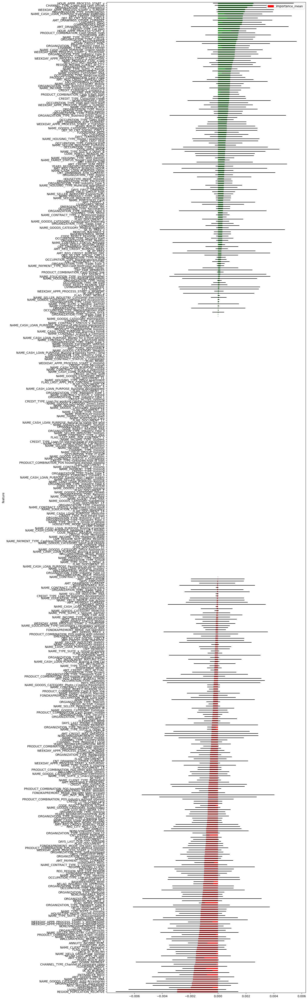

In [21]:
plot_importance(importance_df, figsize=(12, 60))
plt.show()

In [22]:
importance_df

,feature,importance_mean,importance_std,val_imp_0,val_imp_1,val_imp_2
105,HOUR_APPR_PROCESS_START_y,0.002536,0.002896,0.000327,0.006627,0.000654
90,CHANNEL_TYPE_Credit and cash offices,0.002480,0.002710,-0.000004,0.006250,0.001193
332,ORGANIZATION_TYPE_Emergency,0.002094,0.002081,0.000000,0.004933,0.001350
80,WEEKDAY_APPR_PROCESS_START_x_SUNDAY,0.001941,0.002052,0.000000,0.004780,0.001043
458,ORGANIZATION_TYPE_Kindergarten,0.001922,0.002012,0.000000,0.004700,0.001064
...,...,...,...,...,...,...
417,ORGANIZATION_TYPE_Agriculture,-0.001867,0.003301,-0.006507,0.000000,0.000905
170,RATE_INTEREST_PRIMARY,-0.001869,0.002806,-0.005677,0.001004,-0.000933
272,APARTMENTS_AVG,-0.001950,0.001559,-0.004114,-0.001231,-0.000504
207,LIVINGAPARTMENTS_AVG,-0.002913,0.003497,-0.007852,-0.000205,-0.000683


In [114]:
important_features = importance_df.sort_values(by='importance_mean', ascending=False)['feature'].tolist()

important_features = important_features[:-70]
print(len(important_features))

398


In [115]:
important_features

['HOUR_APPR_PROCESS_START_y',
 'CHANNEL_TYPE_Credit and cash offices',
 'ORGANIZATION_TYPE_Emergency',
 'WEEKDAY_APPR_PROCESS_START_x_SUNDAY',
 'ORGANIZATION_TYPE_Kindergarten',
 'NAME_CASH_LOAN_PURPOSE_Everyday expenses',
 'DAYS_CREDIT_ENDDATE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'AMT_DRAWINGS_OTHER_CURRENT',
 'LANDAREA_MEDI',
 'COMMONAREA_MEDI',
 'AMT_DRAWINGS_POS_CURRENT',
 'CREDIT_TYPE_Car loan',
 'HOUR_APPR_PROCESS_START_x',
 'PRODUCT_COMBINATION_Cash Street: high',
 'FLOORSMIN_AVG',
 'NAME_TYPE_SUITE_x_Family',
 'ORGANIZATION_TYPE_Culture',
 'DAYS_REGISTRATION',
 'INCOME_CREDIT_PERC',
 'ORGANIZATION_TYPE_Industry: type 11',
 'CHANNEL_TYPE_Contact center',
 'NAME_CASH_LOAN_PURPOSE_Urgent needs',
 'WEEKDAY_APPR_PROCESS_START_y_THURSDAY',
 'ORGANIZATION_TYPE_Industry: type 8',
 'PRODUCT_COMBINATION_Cash',
 'WEEKDAY_APPR_PROCESS_START_y_SATURDAY',
 'NAME_PRODUCT_TYPE_x-sell',
 'REG_CITY_NOT_WORK_CITY',
 'REGION_RATING_CLIENT_W_CITY',
 'ORGANIZATION_TYPE_Other',
 'NAME_TYPE_SUITE_y_Family'

In [24]:
important_features= ['HOUR_APPR_PROCESS_START_y',
 'CHANNEL_TYPE_Credit and cash offices',
 'ORGANIZATION_TYPE_Emergency',
 'WEEKDAY_APPR_PROCESS_START_x_SUNDAY',
 'ORGANIZATION_TYPE_Kindergarten',
 'NAME_CASH_LOAN_PURPOSE_Everyday expenses',
 'DAYS_CREDIT_ENDDATE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'AMT_DRAWINGS_OTHER_CURRENT',
 'LANDAREA_MEDI',
 'COMMONAREA_MEDI',
 'AMT_DRAWINGS_POS_CURRENT',
 'CREDIT_TYPE_Car loan',
 'HOUR_APPR_PROCESS_START_x',
 'PRODUCT_COMBINATION_Cash Street: high',
 'FLOORSMIN_AVG',
 'NAME_TYPE_SUITE_x_Family',
 'ORGANIZATION_TYPE_Culture',
 'DAYS_REGISTRATION',
 'INCOME_CREDIT_PERC',
 'ORGANIZATION_TYPE_Industry: type 11',
 'CHANNEL_TYPE_Contact center',
 'NAME_CASH_LOAN_PURPOSE_Urgent needs',
 'WEEKDAY_APPR_PROCESS_START_y_THURSDAY',
 'ORGANIZATION_TYPE_Industry: type 8',
 'PRODUCT_COMBINATION_Cash',
 'WEEKDAY_APPR_PROCESS_START_y_SATURDAY',
 'NAME_PRODUCT_TYPE_x-sell',
 'REG_CITY_NOT_WORK_CITY',
 'REGION_RATING_CLIENT_W_CITY',
 'ORGANIZATION_TYPE_Other',
 'NAME_TYPE_SUITE_y_Family',
 'NONLIVINGAPARTMENTS_AVG',
 'NAME_GOODS_CATEGORY_XNA',
 'OCCUPATION_TYPE_Medicine staff',
 'PRODUCT_COMBINATION_Card X-Sell',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'CNT_DRAWINGS_CURRENT',
 'NAME_GOODS_CATEGORY_Mobile',
 'ORGANIZATION_TYPE_Business Entity Type 2',
 'NAME_INCOME_TYPE_Commercial associate',
 'CREDIT_CURRENCY_currency 2',
 'INCOME_PER_PERSON',
 'PRODUCT_COMBINATION_Cash X-Sell: high',
 'AMT_ANNUITY_y',
 'CREDIT_TYPE_Consumer credit',
 'NONLIVINGAREA_AVG',
 'OCCUPATION_TYPE_High skill tech staff',
 'WEEKDAY_APPR_PROCESS_START_y_SUNDAY',
 'NAME_PORTFOLIO_POS',
 'ORGANIZATION_TYPE_Police',
 'OCCUPATION_TYPE_Realty agents',
 'ORGANIZATION_TYPE_Construction',
 'ORGANIZATION_TYPE_Business Entity Type 3',
 'FLAG_PHONE',
 'OCCUPATION_TYPE_Sales staff',
 'AMT_DRAWINGS_ATM_CURRENT',
 'WEEKDAY_APPR_PROCESS_START_x_TUESDAY',
 'YEARS_BUILD_MEDI',
 'NAME_GOODS_CATEGORY_Computers',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'FLOORSMAX_MEDI',
 'CNT_CHILDREN',
 'DAYS_TERMINATION',
 'NAME_HOUSING_TYPE_House / apartment',
 'DAYS_LAST_DUE',
 'OCCUPATION_TYPE_Cooking staff',
 'NAME_SELLER_INDUSTRY_Furniture',
 'OCCUPATION_TYPE_missing',
 'TOTALAREA_MODE',
 'NAME_TYPE_SUITE_x_Other_B',
 'CODE_REJECT_REASON_HC',
 'APARTMENTS_MEDI',
 'NAME_HOUSING_TYPE_With parents',
 'NAME_FAMILY_STATUS_Single / not married',
 'AMT_CREDIT_SUM',
 'AMT_CREDIT_SUM_DEBT',
 'YEARS_BEGINEXPLUATATION_MODE',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'NAME_CASH_LOAN_PURPOSE_Other',
 'CNT_DRAWINGS_ATM_CURRENT',
 'ORGANIZATION_TYPE_Postal',
 'SK_DPD_y',
 'HOUSETYPE_MODE_missing',
 'ORGANIZATION_TYPE_Electricity',
 'ORGANIZATION_TYPE_Industry: type 3',
 'NAME_HOUSING_TYPE_Municipal apartment',
 'FLAG_EMAIL',
 'DAYS_FIRST_DRAWING',
 'NAME_YIELD_GROUP_high',
 'NAME_SELLER_INDUSTRY_Connectivity',
 'NAME_PRODUCT_TYPE_walk-in',
 'NAME_SELLER_INDUSTRY_Clothing',
 'NAME_PORTFOLIO_Cash',
 'AMT_CREDIT_x',
 'LIVINGAREA_MODE',
 'EMERGENCYSTATE_MODE_Yes',
 'OCCUPATION_TYPE_Secretaries',
 'ORGANIZATION_TYPE_Industry: type 4',
 'CHANNEL_TYPE_Stone',
 'NAME_CONTRACT_TYPE_y_Revolving loans',
 'YEARS_BUILD_MODE',
 'FLAG_DOCUMENT_6',
 'NAME_GOODS_CATEGORY_Construction Materials',
 'ORGANIZATION_TYPE_Trade: type 7',
 'LIVINGAREA_AVG',
 'NAME_GOODS_CATEGORY_Medical Supplies',
 'SK_ID_PREV_y',
 'MONTHS_BALANCE_y',
 'BASEMENTAREA_MODE',
 'CODE_REJECT_REASON_LIMIT',
 'OCCUPATION_TYPE_Security staff',
 'ORGANIZATION_TYPE_Realtor',
 'NAME_CONTRACT_STATUS_Refused',
 'CODE_REJECT_REASON_VERIF',
 'CNT_DRAWINGS_POS_CURRENT',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'SK_ID_PREV',
 'AMT_REQ_CREDIT_BUREAU_DAY',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'ORGANIZATION_TYPE_Mobile',
 'OCCUPATION_TYPE_Private service staff',
 'CNT_INSTALMENT_FUTURE',
 'ORGANIZATION_TYPE_Trade: type 3',
 'NAME_PAYMENT_TYPE_Non-cash from your account',
 'AMT_INCOME_TOTAL',
 'CNT_FAM_MEMBERS',
 'PRODUCT_COMBINATION_Cash Street: low',
 'EXT_SOURCE_3',
 'NAME_EDUCATION_TYPE_Incomplete higher',
 'NAME_HOUSING_TYPE_Rented apartment',
 'ORGANIZATION_TYPE_Hotel',
 'OCCUPATION_TYPE_HR staff',
 'CODE_REJECT_REASON_XAP',
 'LIVINGAPARTMENTS_MODE',
 'EXT_SOURCE_1',
 'WEEKDAY_APPR_PROCESS_START_x_MONDAY',
 'SK_DPD_DEF_y',
 'FLAG_CONT_MOBILE',
 'NAME_SELLER_INDUSTRY_Consumer electronics',
 'NAME_GOODS_CATEGORY_Clothing and Accessories',
 'ORGANIZATION_TYPE_Legal Services',
 'NAME_TYPE_SUITE_y_Spouse, partner',
 'NAME_CONTRACT_STATUS_x_missing',
 'ORGANIZATION_TYPE_Government',
 'OCCUPATION_TYPE_Waiters/barmen staff',
 'WALLSMATERIAL_MODE_Stone, brick',
 'ORGANIZATION_TYPE_Trade: type 6',
 'AMT_RECIVABLE',
 'NAME_GOODS_CATEGORY_Homewares',
 'NAME_CONTRACT_STATUS_x_Amortized debt',
 'NAME_GOODS_CATEGORY_Other',
 'WEEKDAY_APPR_PROCESS_START_y_missing',
 'NAME_CASH_LOAN_PURPOSE_missing',
 'NAME_CONTRACT_STATUS_x_Approved',
 'ORGANIZATION_TYPE_Religion',
 'NAME_PRODUCT_TYPE_missing',
 'NAME_CONTRACT_STATUS_y_Signed',
 'FLAG_MOBIL',
 'NAME_HOUSING_TYPE_Office apartment',
 'ORGANIZATION_TYPE_Industry: type 10',
 'NAME_GOODS_CATEGORY_Sport and Leisure',
 'CODE_GENDER_XNA',
 'FLAG_DOCUMENT_11',
 'FLAG_DOCUMENT_4',
 'FLAG_LAST_APPL_PER_CONTRACT_missing',
 'FLAG_DOCUMENT_10',
 'NAME_CASH_LOAN_PURPOSE_Business development',
 'FLAG_DOCUMENT_21',
 'ORGANIZATION_TYPE_Transport: type 1',
 'NAME_GOODS_CATEGORY_Office Appliances',
 'NAME_CONTRACT_STATUS_x_Signed',
 'ORGANIZATION_TYPE_Industry: type 1',
 'CREDIT_ACTIVE_missing',
 'CREDIT_TYPE_Loan for working capital replenishment',
 'NAME_GOODS_CATEGORY_Direct Sales',
 'NAME_CASH_LOAN_PURPOSE_Hobby',
 'CREDIT_TYPE_Microloan',
 'FLAG_DOCUMENT_15',
 'ORGANIZATION_TYPE_Industry: type 13',
 'NAME_CASH_LOAN_PURPOSE_Buying a used car',
 'NAME_CONTRACT_STATUS_x_Returned to the store',
 'CODE_REJECT_REASON_missing',
 'NAME_CASH_LOAN_PURPOSE_Wedding / gift / holiday',
 'NAME_CASH_LOAN_PURPOSE_Buying a garage',
 'FLAG_EMP_PHONE',
 'HOUSETYPE_MODE_terraced house',
 'NAME_TYPE_SUITE_y_Group of people',
 'ORGANIZATION_TYPE_Transport: type 3',
 'NAME_CLIENT_TYPE_XNA',
 'NAME_INCOME_TYPE_Maternity leave',
 'NAME_CASH_LOAN_PURPOSE_Medicine',
 'FLAG_DOCUMENT_19',
 'NAME_EDUCATION_TYPE_Lower secondary',
 'ORGANIZATION_TYPE_Cleaning',
 'WALLSMATERIAL_MODE_Mixed',
 'FLAG_DOCUMENT_12',
 'CREDIT_TYPE_Mortgage',
 'NAME_GOODS_CATEGORY_Gardening',
 'LIVE_REGION_NOT_WORK_REGION',
 'ORGANIZATION_TYPE_XNA',
 'WALLSMATERIAL_MODE_Monolithic',
 'NAME_CASH_LOAN_PURPOSE_Journey',
 'NAME_CASH_LOAN_PURPOSE_Payments on other loans',
 'FLAG_DOCUMENT_20',
 'NAME_TYPE_SUITE_y_Other_A',
 'ORGANIZATION_TYPE_School',
 'NAME_PAYMENT_TYPE_Cashless from the account of the employer',
 'NAME_CONTRACT_STATUS_y_Completed',
 'CREDIT_TYPE_Real estate loan',
 'CHANNEL_TYPE_Car dealer',
 'NAME_SELLER_INDUSTRY_missing',
 'ORGANIZATION_TYPE_Industry: type 6',
 'CODE_REJECT_REASON_SYSTEM',
 'NAME_GOODS_CATEGORY_missing',
 'NAME_GOODS_CATEGORY_Insurance',
 'FLAG_DOCUMENT_2',
 'NAME_GOODS_CATEGORY_Fitness',
 'NAME_GOODS_CATEGORY_Education',
 'NAME_YIELD_GROUP_missing',
 'NAME_CLIENT_TYPE_missing',
 'CHANNEL_TYPE_missing',
 'NAME_PORTFOLIO_missing',
 'NAME_FAMILY_STATUS_Unknown',
 'NAME_PORTFOLIO_Cars',
 'FLAG_DOCUMENT_17',
 'NAME_CASH_LOAN_PURPOSE_Refusal to name the goal',
 'NAME_GOODS_CATEGORY_Tourism',
 'ORGANIZATION_TYPE_Insurance',
 'CODE_REJECT_REASON_XNA',
 'ORGANIZATION_TYPE_Industry: type 9',
 'NAME_SELLER_INDUSTRY_Tourism',
 'NAME_CONTRACT_TYPE_y_XNA',
 'FLAG_LAST_APPL_PER_CONTRACT_Y',
 'NAME_INCOME_TYPE_Student',
 'CREDIT_TYPE_Loan for the purchase of equipment',
 'NAME_CASH_LOAN_PURPOSE_Car repairs',
 'NAME_SELLER_INDUSTRY_MLM partners',
 'NAME_INCOME_TYPE_Pensioner',
 'NAME_CONTRACT_STATUS_x_Demand',
 'NAME_CASH_LOAN_PURPOSE_Repairs',
 'NAME_CASH_LOAN_PURPOSE_Gasification / water supply',
 'ORGANIZATION_TYPE_Industry: type 2',
 'NAME_CASH_LOAN_PURPOSE_Furniture',
 'PRODUCT_COMBINATION_missing',
 'NAME_CASH_LOAN_PURPOSE_Buying a home',
 'NAME_CONTRACT_STATUS_y_Demand',
 'CREDIT_CURRENCY_missing',
 'NAME_CASH_LOAN_PURPOSE_Money for a third person',
 'NAME_CASH_LOAN_PURPOSE_Purchase of electronic equipment',
 'ORGANIZATION_TYPE_Trade: type 5',
 'NAME_GOODS_CATEGORY_Vehicles',
 'NAME_CONTRACT_STATUS_missing',
 'AMT_TOTAL_RECEIVABLE',
 'NAME_GOODS_CATEGORY_Weapon',
 'CREDIT_CURRENCY_currency 3',
 'NAME_CASH_LOAN_PURPOSE_Buying a holiday home / land',
 'NAME_CONTRACT_STATUS_Unused offer',
 'PRODUCT_COMBINATION_POS household without interest',
 'ORGANIZATION_TYPE_Trade: type 1',
 'CREDIT_TYPE_missing',
 'NAME_PAYMENT_TYPE_missing',
 'NAME_CONTRACT_TYPE_y_missing',
 'NAME_INCOME_TYPE_Unemployed',
 'FLAG_DOCUMENT_7',
 'CREDIT_TYPE_Unknown type of loan',
 'NAME_CONTRACT_STATUS_x_Completed',
 'OCCUPATION_TYPE_IT staff',
 'FLAG_DOCUMENT_18',
 'CREDIT_ACTIVE_Sold',
 'WALLSMATERIAL_MODE_missing',
 'NAME_CONTRACT_STATUS_y_missing',
 'AMT_APPLICATION',
 'DAYS_EMPLOYED',
 'AMT_DRAWINGS_CURRENT',
 'BASEMENTAREA_AVG',
 'NAME_CONTRACT_TYPE_x_Revolving loans',
 'ORGANIZATION_TYPE_Trade: type 2',
 'ENTRANCES_MODE',
 'NAME_SELLER_INDUSTRY_XNA',
 'CREDIT_TYPE_Loan for business development',
 'NAME_EDUCATION_TYPE_Higher education',
 'NAME_YIELD_GROUP_low_action',
 'AMT_PAYMENT_CURRENT',
 'LANDAREA_MODE',
 'NAME_CASH_LOAN_PURPOSE_XAP',
 'FLOORSMAX_AVG',
 'NAME_GOODS_CATEGORY_Medicine',
 'NAME_TYPE_SUITE_x_Spouse, partner',
 'OWN_CAR_AGE',
 'NAME_INCOME_TYPE_State servant',
 'RATE_INTEREST_PRIVILEGED',
 'NAME_FAMILY_STATUS_Widow',
 'WEEKDAY_APPR_PROCESS_START_x_THURSDAY',
 'NAME_EDUCATION_TYPE_Secondary / secondary special',
 'NAME_PORTFOLIO_XNA',
 'FONDKAPREMONT_MODE_not specified',
 'AMT_GOODS_PRICE_x',
 'PRODUCT_COMBINATION_POS mobile with interest',
 'EMERGENCYSTATE_MODE_missing',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'AMT_CREDIT_SUM_OVERDUE',
 'NAME_SELLER_INDUSTRY_Jewelry',
 'NAME_GOODS_CATEGORY_Jewelry',
 'NAME_CASH_LOAN_PURPOSE_Education',
 'CNT_PAYMENT',
 'NAME_TYPE_SUITE_x_Group of people',
 'FLAG_DOCUMENT_16',
 'FLOORSMIN_MEDI',
 'ORGANIZATION_TYPE_Industry: type 7',
 'CNT_INSTALMENT_MATURE_CUM',
 'NAME_CASH_LOAN_PURPOSE_Buying a new car',
 'CNT_INSTALMENT',
 'NAME_TYPE_SUITE_x_Other_A',
 'FLOORSMAX_MODE',
 'AMT_CREDIT_LIMIT_ACTUAL',
 'OCCUPATION_TYPE_Drivers',
 'ORGANIZATION_TYPE_Transport: type 2',
 'PRODUCT_COMBINATION_POS mobile without interest',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'OCCUPATION_TYPE_Laborers',
 'DAYS_DECISION',
 'NAME_GOODS_CATEGORY_Photo / Cinema Equipment',
 'NAME_CONTRACT_STATUS_Canceled',
 'CODE_REJECT_REASON_SCO',
 'PRODUCT_COMBINATION_Cash X-Sell: low',
 'NAME_FAMILY_STATUS_Married',
 'FONDKAPREMONT_MODE_reg oper account',
 'OCCUPATION_TYPE_Core staff',
 'APARTMENTS_MODE',
 'ORGANIZATION_TYPE_Telecom',
 'CREDIT_ACTIVE_Closed',
 'NAME_SELLER_INDUSTRY_Industry',
 'CODE_GENDER_M',
 'NAME_GOODS_CATEGORY_Furniture',
 'PRODUCT_COMBINATION_Cash Street: middle',
 'ORGANIZATION_TYPE_Security',
 'ORGANIZATION_TYPE_Trade: type 4',
 'EXT_SOURCE_2',
 'ELEVATORS_MEDI',
 'DAYS_LAST_PHONE_CHANGE',
 'RATE_DOWN_PAYMENT',
 'ORGANIZATION_TYPE_Security Ministries',
 'NAME_TYPE_SUITE_y_Other_B',
 'DAYS_CREDIT',
 'AMT_CREDIT_MAX_OVERDUE',
 'NONLIVINGAPARTMENTS_MODE',
 'NAME_YIELD_GROUP_middle',
 'CHANNEL_TYPE_Country-wide',
 'CHANNEL_TYPE_Regional / Local',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'PRODUCT_COMBINATION_POS industry with interest',
 'ORGANIZATION_TYPE_Military',
 'WEEKDAY_APPR_PROCESS_START_y_MONDAY',
 'ELEVATORS_MODE',
 'ORGANIZATION_TYPE_Restaurant',
 'DAYS_FIRST_DUE',
 'FLAG_DOCUMENT_8',
 'CNT_DRAWINGS_OTHER_CURRENT',
 'WEEKDAY_APPR_PROCESS_START_x_SATURDAY',
 'NAME_TYPE_SUITE_x_missing',
 'FLAG_DOCUMENT_13',
 'PRODUCT_COMBINATION_POS other with interest',
 'WALLSMATERIAL_MODE_Others',
 'NAME_GOODS_CATEGORY_Consumer Electronics',
 'NAME_TYPE_SUITE_y_Unaccompanied',
 'SK_DPD_x',
 'NAME_CLIENT_TYPE_Refreshed',
 'AMT_RECEIVABLE_PRINCIPAL',
 'CREDIT_DAY_OVERDUE',
 'LANDAREA_AVG',
 'PRODUCT_COMBINATION_POS household with interest',
 'WALLSMATERIAL_MODE_Wooden',
 'FONDKAPREMONT_MODE_reg oper spec account',
 'AMT_INST_MIN_REGULARITY',
 'AMT_BALANCE',
 'PRODUCT_COMBINATION_POS industry without interest',
 'CREDIT_TYPE_Credit card',
 'FLAG_DOCUMENT_9',
 'CODE_REJECT_REASON_SCOFR',
 'NAME_GOODS_CATEGORY_Audio/Video',
 'LIVE_CITY_NOT_WORK_CITY',
 'ORGANIZATION_TYPE_Housing',
 'YEARS_BEGINEXPLUATATION_AVG',
 'ORGANIZATION_TYPE_Business Entity Type 1',
 'OCCUPATION_TYPE_Cleaning staff',
 'NAME_CASH_LOAN_PURPOSE_XNA',
 'REG_REGION_NOT_WORK_REGION',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'REG_CITY_NOT_LIVE_CITY',
 'AMT_ANNUITY',
 'NONLIVINGAREA_MODE',
 'ORGANIZATION_TYPE_Industry: type 12',
 'CNT_CREDIT_PROLONG',
 'SELLERPLACE_AREA',
 'FLAG_DOCUMENT_5',
 'DAYS_LAST_DUE_1ST_VERSION',
 'FLAG_DOCUMENT_3'
]

In [25]:
missing_features = [f for f in important_features if f not in X_train_encoded.columns]
print("Missing features:", missing_features)

Missing features: []


In [26]:
X_train_important = X_train_encoded[important_features]
X_valid_important = X_valid_encoded[important_features]

In [27]:
lgb_model = LGBMClassifier(
    objective='binary',
    metric='auc',
    random_state=17,
)

In [28]:
import re
def clean_column_names(columns):
    cleaned_columns = [re.sub(r'[^A-Za-z0-9_]+', '', col) for col in columns]
    return cleaned_columns

# Özellik adlarını temizleme
X_train_important.columns = clean_column_names(X_train_important.columns)
X_valid_important.columns = clean_column_names(X_valid_important.columns)

# Modeli yeniden eğitme
lgb_model.fit(X_train_important, y_train)


[LightGBM] [Info] Number of positive: 22296, number of negative: 254463
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.135968 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 19667
[LightGBM] [Info] Number of data points in the train set: 276759, number of used features: 374
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080561 -> initscore=-2.434748
[LightGBM] [Info] Start training from score -2.434748


LGBMClassifier(metric='auc', objective='binary', random_state=17)

In [29]:
scores = cross_val_score(lgb_model, X_train_important, y_train, cv=skf, scoring='roc_auc')

print("Cross-Validation Mean ROC-AUC Score:", scores.mean())

[LightGBM] [Info] Number of positive: 14864, number of negative: 169642
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.107221 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 19736
[LightGBM] [Info] Number of data points in the train set: 184506, number of used features: 371
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.080561 -> initscore=-2.434748
[LightGBM] [Info] Start training from score -2.434748
[LightGBM] [Info] Number of positive: 14864, number of negative: 169642
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.121037 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 19717
[LightGBM] [Info] Number of data points in the train set: 184506, number of used features: 369
[LightGBM]

#### Optuna

In [30]:
X_train_final, X_valid_final, y_train_final, y_valid_final = train_test_split(
    X_train_important, y_train, test_size=0.2, random_state=17
)

In [31]:
def objective_lgbm(trial):
    param_grid = {
        "n_estimators": trial.suggest_int("n_estimators", 200, 1000),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.05),
        "max_depth": trial.suggest_int("max_depth", 4, 7),
        "feature_fraction": trial.suggest_float("feature_fraction", 0.7, 0.9),
        "bagging_fraction": trial.suggest_float("bagging_fraction", 0.7, 0.9),
        "subsample": trial.suggest_float("subsample", 0.7, 0.9),
        "lambda_l1": trial.suggest_float("lambda_l1", 1e-8, 1.0),
        "lambda_l2": trial.suggest_float("lambda_l2", 1e-8, 1.0),
        "min_child_samples": trial.suggest_int("min_child_samples", 20, 50),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.7, 0.9),
        "objective": "binary",
        "random_state": 42,
        "class_weight": "balanced"
    }
    
    lgbm_optuna_model = lgb.LGBMClassifier(**param_grid)
    return cross_val_score(lgbm_optuna_model, X_train_final, y_train_final, scoring='roc_auc', cv=skf, n_jobs=-1).mean()



In [32]:
study = optuna.create_study(direction='maximize')
study.optimize(objective_lgbm, n_trials=50)

print("Best hyperparameters: ", study.best_trial.params)

[I 2024-09-03 10:40:50,674] A new study created in memory with name: no-name-6f9c0a54-ff7e-45b0-b1b5-c530664396c6


[LightGBM] [Warning] lambda_l1 is set=0.9469954414954416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9469954414954416
[LightGBM] [Warning] lambda_l1 is set=0.9469954414954416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9469954414954416
[LightGBM] [Warning] feature_fraction is set=0.7205774961472207, colsample_bytree=0.7977740546523706 will be ignored. Current value: feature_fraction=0.7205774961472207
[LightGBM] [Warning] bagging_fraction is set=0.8586921867998975, subsample=0.8187258016447176 will be ignored. Current value: bagging_fraction=0.8586921867998975
[LightGBM] [Warning] lambda_l2 is set=0.5015505779969236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5015505779969236
[LightGBM] [Warning] feature_fraction is set=0.7205774961472207, colsample_bytree=0.7977740546523706 will be ignored. Current value: feature_fraction=0.7205774961472207[LightGBM] [Warning] lambda_l1 is set=0.9469954414954416, reg_alpha=0.0 will be ignored. Current valu

[I 2024-09-03 10:41:13,747] Trial 0 finished with value: 0.7662470415476325 and parameters: {'n_estimators': 224, 'learning_rate': 0.049398935385333104, 'max_depth': 4, 'feature_fraction': 0.7205774961472207, 'bagging_fraction': 0.8586921867998975, 'subsample': 0.8187258016447176, 'lambda_l1': 0.9469954414954416, 'lambda_l2': 0.5015505779969236, 'min_child_samples': 30, 'colsample_bytree': 0.7977740546523706}. Best is trial 0 with value: 0.7662470415476325.


[LightGBM] [Warning] lambda_l1 is set=0.6751017988083079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6751017988083079
[LightGBM] [Warning] feature_fraction is set=0.7332076853876082, colsample_bytree=0.881857003189008 will be ignored. Current value: feature_fraction=0.7332076853876082
[LightGBM] [Warning] bagging_fraction is set=0.8651748359524567, subsample=0.8520444826576218 will be ignored. Current value: bagging_fraction=0.8651748359524567
[LightGBM] [Warning] lambda_l2 is set=0.7211098568318028, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7211098568318028
[LightGBM] [Warning] lambda_l1 is set=0.6751017988083079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6751017988083079
[LightGBM] [Warning] feature_fraction is set=0.7332076853876082, colsample_bytree=0.881857003189008 will be ignored. Current value: feature_fraction=0.7332076853876082
[LightGBM] [Warning] bagging_fraction is set=0.8651748359524567, subsample=0.8520444826576218 will be 

[I 2024-09-03 10:41:53,920] Trial 1 finished with value: 0.7663193348547243 and parameters: {'n_estimators': 378, 'learning_rate': 0.01599518598041369, 'max_depth': 7, 'feature_fraction': 0.7332076853876082, 'bagging_fraction': 0.8651748359524567, 'subsample': 0.8520444826576218, 'lambda_l1': 0.6751017988083079, 'lambda_l2': 0.7211098568318028, 'min_child_samples': 49, 'colsample_bytree': 0.881857003189008}. Best is trial 1 with value: 0.7663193348547243.


[LightGBM] [Warning] lambda_l1 is set=0.12377285761110739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12377285761110739
[LightGBM] [Warning] lambda_l1 is set=0.12377285761110739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12377285761110739
[LightGBM] [Warning] lambda_l1 is set=0.12377285761110739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12377285761110739
[LightGBM] [Warning] feature_fraction is set=0.8160522557536636, colsample_bytree=0.8681887484655958 will be ignored. Current value: feature_fraction=0.8160522557536636
[LightGBM] [Warning] bagging_fraction is set=0.7778867612291998, subsample=0.8441863070760317 will be ignored. Current value: bagging_fraction=0.7778867612291998[LightGBM] [Warning] feature_fraction is set=0.8160522557536636, colsample_bytree=0.8681887484655958 will be ignored. Current value: feature_fraction=0.8160522557536636

[LightGBM] [Warning] lambda_l2 is set=0.7389787966322962, reg_lambda=0.0 will be ignored. Curre

[I 2024-09-03 10:42:30,948] Trial 2 finished with value: 0.758434719882397 and parameters: {'n_estimators': 294, 'learning_rate': 0.011622849900600309, 'max_depth': 6, 'feature_fraction': 0.8160522557536636, 'bagging_fraction': 0.7778867612291998, 'subsample': 0.8441863070760317, 'lambda_l1': 0.12377285761110739, 'lambda_l2': 0.7389787966322962, 'min_child_samples': 29, 'colsample_bytree': 0.8681887484655958}. Best is trial 1 with value: 0.7663193348547243.


[LightGBM] [Warning] lambda_l1 is set=0.8560166396934802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8560166396934802
[LightGBM] [Warning] feature_fraction is set=0.8935227051428742, colsample_bytree=0.7277694381476545 will be ignored. Current value: feature_fraction=0.8935227051428742
[LightGBM] [Warning] bagging_fraction is set=0.7831615748136023, subsample=0.8592912151123817 will be ignored. Current value: bagging_fraction=0.7831615748136023
[LightGBM] [Warning] lambda_l2 is set=0.8693177249244953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8693177249244953
[LightGBM] [Warning] lambda_l1 is set=0.8560166396934802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8560166396934802
[LightGBM] [Warning] feature_fraction is set=0.8935227051428742, colsample_bytree=0.7277694381476545 will be ignored. Current value: feature_fraction=0.8935227051428742
[LightGBM] [Warning] lambda_l1 is set=0.8560166396934802, reg_alpha=0.0 will be ignored. Current val

[I 2024-09-03 10:43:43,809] Trial 3 finished with value: 0.7687507987769097 and parameters: {'n_estimators': 684, 'learning_rate': 0.024997502507078877, 'max_depth': 7, 'feature_fraction': 0.8935227051428742, 'bagging_fraction': 0.7831615748136023, 'subsample': 0.8592912151123817, 'lambda_l1': 0.8560166396934802, 'lambda_l2': 0.8693177249244953, 'min_child_samples': 22, 'colsample_bytree': 0.7277694381476545}. Best is trial 3 with value: 0.7687507987769097.


[LightGBM] [Warning] lambda_l1 is set=0.20264096176193724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20264096176193724
[LightGBM] [Warning] lambda_l1 is set=0.20264096176193724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20264096176193724[LightGBM] [Warning] feature_fraction is set=0.7767321300794899, colsample_bytree=0.7677447133915001 will be ignored. Current value: feature_fraction=0.7767321300794899[LightGBM] [Warning] lambda_l1 is set=0.20264096176193724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20264096176193724


[LightGBM] [Warning] bagging_fraction is set=0.8914731015885912, subsample=0.7579350862217306 will be ignored. Current value: bagging_fraction=0.8914731015885912
[LightGBM] [Warning] lambda_l2 is set=0.12998422201064658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12998422201064658
[LightGBM] [Warning] feature_fraction is set=0.7767321300794899, colsample_bytree=0.7677447133915001 will be ignored. Current va

[I 2024-09-03 10:44:22,440] Trial 4 finished with value: 0.7673665117014478 and parameters: {'n_estimators': 427, 'learning_rate': 0.047454743612195927, 'max_depth': 5, 'feature_fraction': 0.7767321300794899, 'bagging_fraction': 0.8914731015885912, 'subsample': 0.7579350862217306, 'lambda_l1': 0.20264096176193724, 'lambda_l2': 0.12998422201064658, 'min_child_samples': 26, 'colsample_bytree': 0.7677447133915001}. Best is trial 3 with value: 0.7687507987769097.


[LightGBM] [Warning] lambda_l1 is set=0.39512967333444127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39512967333444127
[LightGBM] [Warning] lambda_l1 is set=0.39512967333444127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39512967333444127[LightGBM] [Warning] lambda_l1 is set=0.39512967333444127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39512967333444127

[LightGBM] [Warning] feature_fraction is set=0.858154041192763, colsample_bytree=0.7790799676998856 will be ignored. Current value: feature_fraction=0.858154041192763
[LightGBM] [Warning] feature_fraction is set=0.858154041192763, colsample_bytree=0.7790799676998856 will be ignored. Current value: feature_fraction=0.858154041192763
[LightGBM] [Warning] bagging_fraction is set=0.7344486883315903, subsample=0.7263164433583018 will be ignored. Current value: bagging_fraction=0.7344486883315903
[LightGBM] [Warning] feature_fraction is set=0.858154041192763, colsample_bytree=0.7790799676998856

[I 2024-09-03 10:45:11,912] Trial 5 finished with value: 0.7682468411265946 and parameters: {'n_estimators': 600, 'learning_rate': 0.023212996572295985, 'max_depth': 5, 'feature_fraction': 0.858154041192763, 'bagging_fraction': 0.7344486883315903, 'subsample': 0.7263164433583018, 'lambda_l1': 0.39512967333444127, 'lambda_l2': 0.4281058189772318, 'min_child_samples': 40, 'colsample_bytree': 0.7790799676998856}. Best is trial 3 with value: 0.7687507987769097.


[LightGBM] [Warning] lambda_l1 is set=0.40876539431429343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40876539431429343
[LightGBM] [Warning] feature_fraction is set=0.8485198799215202, colsample_bytree=0.7657505879706726 will be ignored. Current value: feature_fraction=0.8485198799215202[LightGBM] [Warning] lambda_l1 is set=0.40876539431429343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40876539431429343

[LightGBM] [Warning] bagging_fraction is set=0.8676447594949567, subsample=0.7470628836199023 will be ignored. Current value: bagging_fraction=0.8676447594949567
[LightGBM] [Warning] lambda_l2 is set=0.9751285374394477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9751285374394477
[LightGBM] [Warning] feature_fraction is set=0.8485198799215202, colsample_bytree=0.7657505879706726 will be ignored. Current value: feature_fraction=0.8485198799215202
[LightGBM] [Warning] bagging_fraction is set=0.8676447594949567, subsample=0.7470628836199023 wi

[I 2024-09-03 10:45:42,986] Trial 6 finished with value: 0.7676522825878583 and parameters: {'n_estimators': 323, 'learning_rate': 0.04197065030085046, 'max_depth': 5, 'feature_fraction': 0.8485198799215202, 'bagging_fraction': 0.8676447594949567, 'subsample': 0.7470628836199023, 'lambda_l1': 0.40876539431429343, 'lambda_l2': 0.9751285374394477, 'min_child_samples': 23, 'colsample_bytree': 0.7657505879706726}. Best is trial 3 with value: 0.7687507987769097.


[LightGBM] [Warning] lambda_l1 is set=0.5334950766826233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5334950766826233[LightGBM] [Warning] lambda_l1 is set=0.5334950766826233, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5334950766826233

[LightGBM] [Warning] feature_fraction is set=0.721415502103068, colsample_bytree=0.7576597711491364 will be ignored. Current value: feature_fraction=0.721415502103068[LightGBM] [Warning] feature_fraction is set=0.721415502103068, colsample_bytree=0.7576597711491364 will be ignored. Current value: feature_fraction=0.721415502103068

[LightGBM] [Warning] bagging_fraction is set=0.8536294753626567, subsample=0.8773076126493423 will be ignored. Current value: bagging_fraction=0.8536294753626567
[LightGBM] [Warning] bagging_fraction is set=0.8536294753626567, subsample=0.8773076126493423 will be ignored. Current value: bagging_fraction=0.8536294753626567
[LightGBM] [Warning] lambda_l2 is set=0.4335436668522258, reg_lambda=0.0 wil

[I 2024-09-03 10:46:16,415] Trial 7 finished with value: 0.7617707480789262 and parameters: {'n_estimators': 245, 'learning_rate': 0.017474644615965183, 'max_depth': 6, 'feature_fraction': 0.721415502103068, 'bagging_fraction': 0.8536294753626567, 'subsample': 0.8773076126493423, 'lambda_l1': 0.5334950766826233, 'lambda_l2': 0.4335436668522258, 'min_child_samples': 42, 'colsample_bytree': 0.7576597711491364}. Best is trial 3 with value: 0.7687507987769097.


[LightGBM] [Warning] lambda_l1 is set=0.4953610728858713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4953610728858713
[LightGBM] [Warning] feature_fraction is set=0.7415158223936561, colsample_bytree=0.8566962491428888 will be ignored. Current value: feature_fraction=0.7415158223936561[LightGBM] [Warning] lambda_l1 is set=0.4953610728858713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4953610728858713

[LightGBM] [Warning] bagging_fraction is set=0.885443137584896, subsample=0.8203523048539877 will be ignored. Current value: bagging_fraction=0.885443137584896
[LightGBM] [Warning] lambda_l2 is set=0.7577461971019509, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.7577461971019509
[LightGBM] [Warning] feature_fraction is set=0.7415158223936561, colsample_bytree=0.8566962491428888 will be ignored. Current value: feature_fraction=0.7415158223936561
[LightGBM] [Warning] bagging_fraction is set=0.885443137584896, subsample=0.8203523048539877 will be i

[I 2024-09-03 10:47:20,626] Trial 8 finished with value: 0.7687654296890493 and parameters: {'n_estimators': 825, 'learning_rate': 0.02587230729172858, 'max_depth': 5, 'feature_fraction': 0.7415158223936561, 'bagging_fraction': 0.885443137584896, 'subsample': 0.8203523048539877, 'lambda_l1': 0.4953610728858713, 'lambda_l2': 0.7577461971019509, 'min_child_samples': 28, 'colsample_bytree': 0.8566962491428888}. Best is trial 8 with value: 0.7687654296890493.


[LightGBM] [Warning] lambda_l1 is set=0.6164738201128143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6164738201128143[LightGBM] [Warning] lambda_l1 is set=0.6164738201128143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6164738201128143
[LightGBM] [Warning] lambda_l1 is set=0.6164738201128143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6164738201128143

[LightGBM] [Warning] feature_fraction is set=0.8378543943464236, colsample_bytree=0.7387704564381998 will be ignored. Current value: feature_fraction=0.8378543943464236
[LightGBM] [Warning] bagging_fraction is set=0.7870535513347907, subsample=0.8031004172294994 will be ignored. Current value: bagging_fraction=0.7870535513347907
[LightGBM] [Warning] lambda_l2 is set=0.5376927047087549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5376927047087549
[LightGBM] [Warning] feature_fraction is set=0.8378543943464236, colsample_bytree=0.7387704564381998 will be ignored. Current value: fea

[I 2024-09-03 10:47:56,491] Trial 9 finished with value: 0.7634437714987604 and parameters: {'n_estimators': 305, 'learning_rate': 0.016180523131482053, 'max_depth': 6, 'feature_fraction': 0.8378543943464236, 'bagging_fraction': 0.7870535513347907, 'subsample': 0.8031004172294994, 'lambda_l1': 0.6164738201128143, 'lambda_l2': 0.5376927047087549, 'min_child_samples': 29, 'colsample_bytree': 0.7387704564381998}. Best is trial 8 with value: 0.7687654296890493.


[LightGBM] [Warning] lambda_l1 is set=0.6164738201128143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6164738201128143
[LightGBM] [Warning] feature_fraction is set=0.8378543943464236, colsample_bytree=0.7387704564381998 will be ignored. Current value: feature_fraction=0.8378543943464236[LightGBM] [Warning] lambda_l1 is set=0.6164738201128143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6164738201128143[LightGBM] [Warning] lambda_l1 is set=0.6164738201128143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6164738201128143


[LightGBM] [Warning] bagging_fraction is set=0.7870535513347907, subsample=0.8031004172294994 will be ignored. Current value: bagging_fraction=0.7870535513347907
[LightGBM] [Warning] lambda_l2 is set=0.5376927047087549, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.5376927047087549
[LightGBM] [Warning] feature_fraction is set=0.8378543943464236, colsample_bytree=0.7387704564381998 will be ignored. Current value: fea

[I 2024-09-03 10:48:54,333] Trial 10 finished with value: 0.7693155979692324 and parameters: {'n_estimators': 957, 'learning_rate': 0.0358190697880508, 'max_depth': 4, 'feature_fraction': 0.7700457165321022, 'bagging_fraction': 0.7001402433599109, 'subsample': 0.8993847103590806, 'lambda_l1': 0.266631185947916, 'lambda_l2': 0.06798571243681395, 'min_child_samples': 36, 'colsample_bytree': 0.836830383379772}. Best is trial 10 with value: 0.7693155979692324.


[LightGBM] [Warning] lambda_l1 is set=0.29312622590464826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29312622590464826
[LightGBM] [Warning] lambda_l1 is set=0.29312622590464826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29312622590464826
[LightGBM] [Warning] lambda_l1 is set=0.29312622590464826, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29312622590464826[LightGBM] [Warning] feature_fraction is set=0.7691216438623129, colsample_bytree=0.8436846282156806 will be ignored. Current value: feature_fraction=0.7691216438623129

[LightGBM] [Warning] feature_fraction is set=0.7691216438623129, colsample_bytree=0.8436846282156806 will be ignored. Current value: feature_fraction=0.7691216438623129
[LightGBM] [Warning] bagging_fraction is set=0.7068390020551101, subsample=0.8867778595217345 will be ignored. Current value: bagging_fraction=0.7068390020551101
[LightGBM] [Warning] lambda_l2 is set=0.04123444374513002, reg_lambda=0.0 will be ignored. Curr

[I 2024-09-03 10:49:46,607] Trial 11 finished with value: 0.7693097771237415 and parameters: {'n_estimators': 995, 'learning_rate': 0.03487705974128607, 'max_depth': 4, 'feature_fraction': 0.7691216438623129, 'bagging_fraction': 0.7068390020551101, 'subsample': 0.8867778595217345, 'lambda_l1': 0.29312622590464826, 'lambda_l2': 0.04123444374513002, 'min_child_samples': 37, 'colsample_bytree': 0.8436846282156806}. Best is trial 10 with value: 0.7693155979692324.


[LightGBM] [Warning] lambda_l1 is set=0.261841762016576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.261841762016576
[LightGBM] [Warning] lambda_l1 is set=0.261841762016576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.261841762016576
[LightGBM] [Warning] lambda_l1 is set=0.261841762016576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.261841762016576
[LightGBM] [Warning] feature_fraction is set=0.7782668417110821, colsample_bytree=0.8329707592548252 will be ignored. Current value: feature_fraction=0.7782668417110821
[LightGBM] [Warning] bagging_fraction is set=0.7000395720647984, subsample=0.8965771943850962 will be ignored. Current value: bagging_fraction=0.7000395720647984
[LightGBM] [Warning] lambda_l2 is set=0.011196564667134996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011196564667134996
[LightGBM] [Warning] feature_fraction is set=0.7782668417110821, colsample_bytree=0.8329707592548252 will be ignored. Current value: featu

[I 2024-09-03 10:50:49,455] Trial 12 finished with value: 0.7691611851600791 and parameters: {'n_estimators': 973, 'learning_rate': 0.035758811803041496, 'max_depth': 4, 'feature_fraction': 0.7782668417110821, 'bagging_fraction': 0.7000395720647984, 'subsample': 0.8965771943850962, 'lambda_l1': 0.261841762016576, 'lambda_l2': 0.011196564667134996, 'min_child_samples': 37, 'colsample_bytree': 0.8329707592548252}. Best is trial 10 with value: 0.7693155979692324.


[LightGBM] [Warning] lambda_l1 is set=0.2946438523113784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2946438523113784
[LightGBM] [Warning] feature_fraction is set=0.766877574259819, colsample_bytree=0.8307388883530742 will be ignored. Current value: feature_fraction=0.766877574259819
[LightGBM] [Warning] bagging_fraction is set=0.7021052613482015, subsample=0.8961601479149892 will be ignored. Current value: bagging_fraction=0.7021052613482015
[LightGBM] [Warning] lambda_l2 is set=0.2285041780879383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2285041780879383
[LightGBM] [Warning] lambda_l1 is set=0.2946438523113784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2946438523113784
[LightGBM] [Warning] feature_fraction is set=0.766877574259819, colsample_bytree=0.8307388883530742 will be ignored. Current value: feature_fraction=0.766877574259819
[LightGBM] [Warning] bagging_fraction is set=0.7021052613482015, subsample=0.8961601479149892 will be ig

[I 2024-09-03 10:51:49,200] Trial 13 finished with value: 0.7694001974741044 and parameters: {'n_estimators': 995, 'learning_rate': 0.03263891345557188, 'max_depth': 4, 'feature_fraction': 0.766877574259819, 'bagging_fraction': 0.7021052613482015, 'subsample': 0.8961601479149892, 'lambda_l1': 0.2946438523113784, 'lambda_l2': 0.2285041780879383, 'min_child_samples': 35, 'colsample_bytree': 0.8307388883530742}. Best is trial 13 with value: 0.7694001974741044.


[LightGBM] [Warning] lambda_l1 is set=0.04258574670461063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04258574670461063
[LightGBM] [Warning] feature_fraction is set=0.8035711764214994, colsample_bytree=0.8211770712250647 will be ignored. Current value: feature_fraction=0.8035711764214994[LightGBM] [Warning] lambda_l1 is set=0.04258574670461063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04258574670461063[LightGBM] [Warning] lambda_l1 is set=0.04258574670461063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04258574670461063


[LightGBM] [Warning] bagging_fraction is set=0.7437810275180448, subsample=0.8970881370988185 will be ignored. Current value: bagging_fraction=0.7437810275180448
[LightGBM] [Warning] lambda_l2 is set=0.2461565942219393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2461565942219393
[LightGBM] [Warning] feature_fraction is set=0.8035711764214994, colsample_bytree=0.8211770712250647 will be ignored. Current valu

[I 2024-09-03 10:52:46,016] Trial 14 finished with value: 0.7693632608907949 and parameters: {'n_estimators': 845, 'learning_rate': 0.03271424279312663, 'max_depth': 4, 'feature_fraction': 0.8035711764214994, 'bagging_fraction': 0.7437810275180448, 'subsample': 0.8970881370988185, 'lambda_l1': 0.04258574670461063, 'lambda_l2': 0.2461565942219393, 'min_child_samples': 34, 'colsample_bytree': 0.8211770712250647}. Best is trial 13 with value: 0.7694001974741044.


[LightGBM] [Warning] lambda_l1 is set=0.01991487522376368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01991487522376368
[LightGBM] [Warning] lambda_l1 is set=0.01991487522376368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01991487522376368[LightGBM] [Warning] feature_fraction is set=0.8064410607192332, colsample_bytree=0.8121779102347806 will be ignored. Current value: feature_fraction=0.8064410607192332[LightGBM] [Warning] lambda_l1 is set=0.01991487522376368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01991487522376368


[LightGBM] [Warning] bagging_fraction is set=0.7472197305422579, subsample=0.778161804811776 will be ignored. Current value: bagging_fraction=0.7472197305422579
[LightGBM] [Warning] lambda_l2 is set=0.2533577115386207, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2533577115386207
[LightGBM] [Warning] feature_fraction is set=0.8064410607192332, colsample_bytree=0.8121779102347806 will be ignored. Current value

[I 2024-09-03 10:53:31,782] Trial 15 finished with value: 0.7689416293158559 and parameters: {'n_estimators': 838, 'learning_rate': 0.04102248235573301, 'max_depth': 4, 'feature_fraction': 0.8064410607192332, 'bagging_fraction': 0.7472197305422579, 'subsample': 0.778161804811776, 'lambda_l1': 0.01991487522376368, 'lambda_l2': 0.2533577115386207, 'min_child_samples': 33, 'colsample_bytree': 0.8121779102347806}. Best is trial 13 with value: 0.7694001974741044.


[LightGBM] [Warning] lambda_l1 is set=0.07645131992824811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07645131992824811[LightGBM] [Warning] lambda_l1 is set=0.07645131992824811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07645131992824811[LightGBM] [Warning] lambda_l1 is set=0.07645131992824811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07645131992824811


[LightGBM] [Warning] feature_fraction is set=0.7018940332869125, colsample_bytree=0.8090264624520902 will be ignored. Current value: feature_fraction=0.7018940332869125
[LightGBM] [Warning] feature_fraction is set=0.7018940332869125, colsample_bytree=0.8090264624520902 will be ignored. Current value: feature_fraction=0.7018940332869125
[LightGBM] [Warning] bagging_fraction is set=0.7443401768130121, subsample=0.8751111855658177 will be ignored. Current value: bagging_fraction=0.7443401768130121
[LightGBM] [Warning] lambda_l2 is set=0.24352845413818333, reg_lambda=0.0 will be ignored. Curr

[I 2024-09-03 10:54:24,945] Trial 16 finished with value: 0.7697308716920114 and parameters: {'n_estimators': 844, 'learning_rate': 0.03121651116511391, 'max_depth': 4, 'feature_fraction': 0.7018940332869125, 'bagging_fraction': 0.7443401768130121, 'subsample': 0.8751111855658177, 'lambda_l1': 0.07645131992824811, 'lambda_l2': 0.24352845413818333, 'min_child_samples': 45, 'colsample_bytree': 0.8090264624520902}. Best is trial 16 with value: 0.7697308716920114.


[LightGBM] [Warning] lambda_l1 is set=0.14059015797593172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14059015797593172
[LightGBM] [Warning] feature_fraction is set=0.7039862713334749, colsample_bytree=0.8932294323303239 will be ignored. Current value: feature_fraction=0.7039862713334749
[LightGBM] [Warning] bagging_fraction is set=0.8207100375127842, subsample=0.8675333145244359 will be ignored. Current value: bagging_fraction=0.8207100375127842
[LightGBM] [Warning] lambda_l2 is set=0.2621330030245744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2621330030245744
[LightGBM] [Warning] lambda_l1 is set=0.14059015797593172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14059015797593172[LightGBM] [Warning] lambda_l1 is set=0.14059015797593172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14059015797593172

[LightGBM] [Warning] feature_fraction is set=0.7039862713334749, colsample_bytree=0.8932294323303239 will be ignored. Current valu

[I 2024-09-03 10:55:21,599] Trial 17 finished with value: 0.769026635887147 and parameters: {'n_estimators': 702, 'learning_rate': 0.028714899661195836, 'max_depth': 5, 'feature_fraction': 0.7039862713334749, 'bagging_fraction': 0.8207100375127842, 'subsample': 0.8675333145244359, 'lambda_l1': 0.14059015797593172, 'lambda_l2': 0.2621330030245744, 'min_child_samples': 48, 'colsample_bytree': 0.8932294323303239}. Best is trial 16 with value: 0.7697308716920114.


[LightGBM] [Warning] lambda_l1 is set=0.38805433002278045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38805433002278045
[LightGBM] [Warning] feature_fraction is set=0.7564791726437081, colsample_bytree=0.7042842292268966 will be ignored. Current value: feature_fraction=0.7564791726437081
[LightGBM] [Warning] bagging_fraction is set=0.7260392671724355, subsample=0.8330811689392478 will be ignored. Current value: bagging_fraction=0.7260392671724355
[LightGBM] [Warning] lambda_l2 is set=0.3354091067827451, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3354091067827451
[LightGBM] [Warning] lambda_l1 is set=0.38805433002278045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38805433002278045[LightGBM] [Warning] lambda_l1 is set=0.38805433002278045, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38805433002278045

[LightGBM] [Warning] feature_fraction is set=0.7564791726437081, colsample_bytree=0.7042842292268966 will be ignored. Current valu

[I 2024-09-03 10:56:07,693] Trial 18 finished with value: 0.7695323756777223 and parameters: {'n_estimators': 870, 'learning_rate': 0.039840633423188776, 'max_depth': 4, 'feature_fraction': 0.7564791726437081, 'bagging_fraction': 0.7260392671724355, 'subsample': 0.8330811689392478, 'lambda_l1': 0.38805433002278045, 'lambda_l2': 0.3354091067827451, 'min_child_samples': 44, 'colsample_bytree': 0.7042842292268966}. Best is trial 16 with value: 0.7697308716920114.


[LightGBM] [Warning] lambda_l1 is set=0.7483805568218964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7483805568218964[LightGBM] [Warning] lambda_l1 is set=0.7483805568218964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7483805568218964

[LightGBM] [Warning] feature_fraction is set=0.7494562993317482, colsample_bytree=0.7912222655561151 will be ignored. Current value: feature_fraction=0.7494562993317482[LightGBM] [Warning] lambda_l1 is set=0.7483805568218964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7483805568218964[LightGBM] [Warning] feature_fraction is set=0.7494562993317482, colsample_bytree=0.7912222655561151 will be ignored. Current value: feature_fraction=0.7494562993317482


[LightGBM] [Warning] bagging_fraction is set=0.7615994039060341, subsample=0.8329472720970245 will be ignored. Current value: bagging_fraction=0.7615994039060341
[LightGBM] [Warning] bagging_fraction is set=0.7615994039060341, subsample=0.8329472720970245 will be

[I 2024-09-03 10:56:55,581] Trial 19 finished with value: 0.7677666467452097 and parameters: {'n_estimators': 741, 'learning_rate': 0.040635895344793616, 'max_depth': 5, 'feature_fraction': 0.7494562993317482, 'bagging_fraction': 0.7615994039060341, 'subsample': 0.8329472720970245, 'lambda_l1': 0.7483805568218964, 'lambda_l2': 0.3683356535569282, 'min_child_samples': 46, 'colsample_bytree': 0.7912222655561151}. Best is trial 16 with value: 0.7697308716920114.


[LightGBM] [Warning] lambda_l1 is set=0.41257362304191897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41257362304191897
[LightGBM] [Warning] feature_fraction is set=0.7009513737340236, colsample_bytree=0.7154730819736361 will be ignored. Current value: feature_fraction=0.7009513737340236[LightGBM] [Warning] lambda_l1 is set=0.41257362304191897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41257362304191897

[LightGBM] [Warning] bagging_fraction is set=0.8096705803871, subsample=0.7064290142371407 will be ignored. Current value: bagging_fraction=0.8096705803871
[LightGBM] [Warning] lambda_l2 is set=0.582774935807369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.582774935807369
[LightGBM] [Warning] feature_fraction is set=0.7009513737340236, colsample_bytree=0.7154730819736361 will be ignored. Current value: feature_fraction=0.7009513737340236
[LightGBM] [Warning] bagging_fraction is set=0.8096705803871, subsample=0.7064290142371407 will be ignor

[I 2024-09-03 10:57:27,768] Trial 20 finished with value: 0.769380181036297 and parameters: {'n_estimators': 546, 'learning_rate': 0.04472963480364161, 'max_depth': 4, 'feature_fraction': 0.7009513737340236, 'bagging_fraction': 0.8096705803871, 'subsample': 0.7064290142371407, 'lambda_l1': 0.41257362304191897, 'lambda_l2': 0.582774935807369, 'min_child_samples': 44, 'colsample_bytree': 0.7154730819736361}. Best is trial 16 with value: 0.7697308716920114.


[LightGBM] [Warning] lambda_l1 is set=0.3405532693730372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3405532693730372
[LightGBM] [Warning] feature_fraction is set=0.7589903465001133, colsample_bytree=0.8153873883941716 will be ignored. Current value: feature_fraction=0.7589903465001133[LightGBM] [Warning] lambda_l1 is set=0.3405532693730372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3405532693730372

[LightGBM] [Warning] bagging_fraction is set=0.7265546100259128, subsample=0.8655783855526069 will be ignored. Current value: bagging_fraction=0.7265546100259128
[LightGBM] [Warning] lambda_l2 is set=0.17162257717076057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.17162257717076057
[LightGBM] [Warning] feature_fraction is set=0.7589903465001133, colsample_bytree=0.8153873883941716 will be ignored. Current value: feature_fraction=0.7589903465001133
[LightGBM] [Warning] bagging_fraction is set=0.7265546100259128, subsample=0.8655783855526069 will

[I 2024-09-03 10:58:21,276] Trial 21 finished with value: 0.7695407616276833 and parameters: {'n_estimators': 912, 'learning_rate': 0.030460380928277585, 'max_depth': 4, 'feature_fraction': 0.7589903465001133, 'bagging_fraction': 0.7265546100259128, 'subsample': 0.8655783855526069, 'lambda_l1': 0.3405532693730372, 'lambda_l2': 0.17162257717076057, 'min_child_samples': 40, 'colsample_bytree': 0.8153873883941716}. Best is trial 16 with value: 0.7697308716920114.


[LightGBM] [Warning] lambda_l1 is set=0.5185690251891311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5185690251891311
[LightGBM] [Warning] lambda_l1 is set=0.5185690251891311, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5185690251891311
[LightGBM] [Warning] feature_fraction is set=0.7496389030133849, colsample_bytree=0.7997081017950405 will be ignored. Current value: feature_fraction=0.7496389030133849
[LightGBM] [Warning] feature_fraction is set=0.7496389030133849, colsample_bytree=0.7997081017950405 will be ignored. Current value: feature_fraction=0.7496389030133849[LightGBM] [Warning] bagging_fraction is set=0.7252122631023474, subsample=0.8383085817914485 will be ignored. Current value: bagging_fraction=0.7252122631023474

[LightGBM] [Warning] lambda_l2 is set=0.1749716434343836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1749716434343836
[LightGBM] [Warning] bagging_fraction is set=0.7252122631023474, subsample=0.8383085817914485 will b

[I 2024-09-03 10:59:16,176] Trial 22 finished with value: 0.769520430625878 and parameters: {'n_estimators': 895, 'learning_rate': 0.028694487809079426, 'max_depth': 4, 'feature_fraction': 0.7496389030133849, 'bagging_fraction': 0.7252122631023474, 'subsample': 0.8383085817914485, 'lambda_l1': 0.5185690251891311, 'lambda_l2': 0.1749716434343836, 'min_child_samples': 41, 'colsample_bytree': 0.7997081017950405}. Best is trial 16 with value: 0.7697308716920114.


[LightGBM] [Warning] lambda_l1 is set=0.11094936671417574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11094936671417574
[LightGBM] [Warning] feature_fraction is set=0.7215522510811166, colsample_bytree=0.7066991895750772 will be ignored. Current value: feature_fraction=0.7215522510811166
[LightGBM] [Warning] lambda_l1 is set=0.11094936671417574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11094936671417574
[LightGBM] [Warning] bagging_fraction is set=0.7594974770179351, subsample=0.8664634543663683 will be ignored. Current value: bagging_fraction=0.7594974770179351
[LightGBM] [Warning] lambda_l2 is set=0.33563556536561096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.33563556536561096
[LightGBM] [Warning] feature_fraction is set=0.7215522510811166, colsample_bytree=0.7066991895750772 will be ignored. Current value: feature_fraction=0.7215522510811166
[LightGBM] [Warning] bagging_fraction is set=0.7594974770179351, subsample=0.8664634543663683 

[I 2024-09-03 11:00:08,674] Trial 23 finished with value: 0.769174112210142 and parameters: {'n_estimators': 903, 'learning_rate': 0.02107306993056656, 'max_depth': 4, 'feature_fraction': 0.7215522510811166, 'bagging_fraction': 0.7594974770179351, 'subsample': 0.8664634543663683, 'lambda_l1': 0.11094936671417574, 'lambda_l2': 0.33563556536561096, 'min_child_samples': 45, 'colsample_bytree': 0.7066991895750772}. Best is trial 16 with value: 0.7697308716920114.


[LightGBM] [Warning] lambda_l1 is set=0.11094936671417574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11094936671417574
[LightGBM] [Warning] feature_fraction is set=0.7215522510811166, colsample_bytree=0.7066991895750772 will be ignored. Current value: feature_fraction=0.7215522510811166
[LightGBM] [Warning] bagging_fraction is set=0.7594974770179351, subsample=0.8664634543663683 will be ignored. Current value: bagging_fraction=0.7594974770179351
[LightGBM] [Warning] lambda_l2 is set=0.33563556536561096, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.33563556536561096
[LightGBM] [Warning] lambda_l1 is set=0.11094936671417574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11094936671417574
[LightGBM] [Warning] feature_fraction is set=0.7215522510811166, colsample_bytree=0.7066991895750772 will be ignored. Current value: feature_fraction=0.7215522510811166
[LightGBM] [Warning] bagging_fraction is set=0.7594974770179351, subsample=0.8664634543663683 

[I 2024-09-03 11:01:06,868] Trial 24 finished with value: 0.7676333453012484 and parameters: {'n_estimators': 769, 'learning_rate': 0.03895108314501265, 'max_depth': 5, 'feature_fraction': 0.7907895714949235, 'bagging_fraction': 0.7206887375850701, 'subsample': 0.7987530000421534, 'lambda_l1': 0.33681547317063326, 'lambda_l2': 0.1333252769994766, 'min_child_samples': 39, 'colsample_bytree': 0.8170776414887482}. Best is trial 16 with value: 0.7697308716920114.


[LightGBM] [Warning] lambda_l1 is set=0.19352260077895833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19352260077895833[LightGBM] [Warning] lambda_l1 is set=0.19352260077895833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19352260077895833

[LightGBM] [Warning] feature_fraction is set=0.7592746990541623, colsample_bytree=0.7466353614201283 will be ignored. Current value: feature_fraction=0.7592746990541623[LightGBM] [Warning] feature_fraction is set=0.7592746990541623, colsample_bytree=0.7466353614201283 will be ignored. Current value: feature_fraction=0.7592746990541623
[LightGBM] [Warning] lambda_l1 is set=0.19352260077895833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19352260077895833

[LightGBM] [Warning] bagging_fraction is set=0.7218455166240224, subsample=0.8294974791650804 will be ignored. Current value: bagging_fraction=0.7218455166240224
[LightGBM] [Warning] lambda_l2 is set=0.3436029806374631, reg_lambda=0.0 will be ignored. Curre

[I 2024-09-03 11:01:58,766] Trial 25 finished with value: 0.7695632723215077 and parameters: {'n_estimators': 909, 'learning_rate': 0.03023732483551177, 'max_depth': 4, 'feature_fraction': 0.7592746990541623, 'bagging_fraction': 0.7218455166240224, 'subsample': 0.8294974791650804, 'lambda_l1': 0.19352260077895833, 'lambda_l2': 0.3436029806374631, 'min_child_samples': 43, 'colsample_bytree': 0.7466353614201283}. Best is trial 16 with value: 0.7697308716920114.


[LightGBM] [Warning] lambda_l1 is set=0.19775831878442166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19775831878442166
[LightGBM] [Warning] lambda_l1 is set=0.19775831878442166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19775831878442166
[LightGBM] [Warning] feature_fraction is set=0.790721771155271, colsample_bytree=0.7451414614332913 will be ignored. Current value: feature_fraction=0.790721771155271
[LightGBM] [Warning] feature_fraction is set=0.790721771155271, colsample_bytree=0.7451414614332913 will be ignored. Current value: feature_fraction=0.790721771155271
[LightGBM] [Warning] bagging_fraction is set=0.7587060964360742, subsample=0.8698272466115942 will be ignored. Current value: bagging_fraction=0.7587060964360742
[LightGBM] [Warning] bagging_fraction is set=0.7587060964360742, subsample=0.8698272466115942 will be ignored. Current value: bagging_fraction=0.7587060964360742
[LightGBM] [Warning] lambda_l2 is set=0.5905553680652753, reg_lambda=0.0

[I 2024-09-03 11:02:49,237] Trial 26 finished with value: 0.7688701418941042 and parameters: {'n_estimators': 625, 'learning_rate': 0.029624040219160264, 'max_depth': 5, 'feature_fraction': 0.790721771155271, 'bagging_fraction': 0.7587060964360742, 'subsample': 0.8698272466115942, 'lambda_l1': 0.19775831878442166, 'lambda_l2': 0.5905553680652753, 'min_child_samples': 47, 'colsample_bytree': 0.7451414614332913}. Best is trial 16 with value: 0.7697308716920114.


[LightGBM] [Warning] lambda_l1 is set=0.18879394357037388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18879394357037388
[LightGBM] [Warning] lambda_l1 is set=0.18879394357037388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18879394357037388
[LightGBM] [Warning] feature_fraction is set=0.8234174882072609, colsample_bytree=0.808794217576964 will be ignored. Current value: feature_fraction=0.8234174882072609[LightGBM] [Warning] feature_fraction is set=0.8234174882072609, colsample_bytree=0.808794217576964 will be ignored. Current value: feature_fraction=0.8234174882072609
[LightGBM] [Warning] lambda_l1 is set=0.18879394357037388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18879394357037388

[LightGBM] [Warning] bagging_fraction is set=0.7157624059898133, subsample=0.8143519863171379 will be ignored. Current value: bagging_fraction=0.7157624059898133
[LightGBM] [Warning] lambda_l2 is set=0.17147302262790182, reg_lambda=0.0 will be ignored. Curren

[I 2024-09-03 11:03:27,133] Trial 27 finished with value: 0.7686406904317202 and parameters: {'n_estimators': 506, 'learning_rate': 0.03160245657684361, 'max_depth': 4, 'feature_fraction': 0.8234174882072609, 'bagging_fraction': 0.7157624059898133, 'subsample': 0.8143519863171379, 'lambda_l1': 0.18879394357037388, 'lambda_l2': 0.17147302262790182, 'min_child_samples': 43, 'colsample_bytree': 0.808794217576964}. Best is trial 16 with value: 0.7697308716920114.


[LightGBM] [Warning] lambda_l1 is set=0.09484656097796094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09484656097796094
[LightGBM] [Warning] feature_fraction is set=0.7247025470375031, colsample_bytree=0.7810748067926714 will be ignored. Current value: feature_fraction=0.7247025470375031
[LightGBM] [Warning] bagging_fraction is set=0.7381154970251942, subsample=0.855707550001827 will be ignored. Current value: bagging_fraction=0.7381154970251942
[LightGBM] [Warning] lambda_l2 is set=0.3773656844395601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3773656844395601
[LightGBM] [Warning] lambda_l1 is set=0.09484656097796094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.09484656097796094
[LightGBM] [Warning] feature_fraction is set=0.7247025470375031, colsample_bytree=0.7810748067926714 will be ignored. Current value: feature_fraction=0.7247025470375031
[LightGBM] [Warning] bagging_fraction is set=0.7381154970251942, subsample=0.855707550001827 will

[I 2024-09-03 11:04:37,643] Trial 28 finished with value: 0.768778750598949 and parameters: {'n_estimators': 778, 'learning_rate': 0.02583274264216736, 'max_depth': 6, 'feature_fraction': 0.7247025470375031, 'bagging_fraction': 0.7381154970251942, 'subsample': 0.855707550001827, 'lambda_l1': 0.09484656097796094, 'lambda_l2': 0.3773656844395601, 'min_child_samples': 38, 'colsample_bytree': 0.7810748067926714}. Best is trial 16 with value: 0.7697308716920114.


[LightGBM] [Warning] lambda_l1 is set=0.01871012394690518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01871012394690518
[LightGBM] [Warning] feature_fraction is set=0.7093718438809974, colsample_bytree=0.7904141461906362 will be ignored. Current value: feature_fraction=0.7093718438809974
[LightGBM] [Warning] lambda_l1 is set=0.01871012394690518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01871012394690518
[LightGBM] [Warning] feature_fraction is set=0.7093718438809974, colsample_bytree=0.7904141461906362 will be ignored. Current value: feature_fraction=0.7093718438809974
[LightGBM] [Warning] bagging_fraction is set=0.769616519805852, subsample=0.7865665867215549 will be ignored. Current value: bagging_fraction=0.769616519805852
[LightGBM] [Warning] lambda_l2 is set=0.4771663290892209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.4771663290892209
[LightGBM] [Warning] bagging_fraction is set=0.769616519805852, subsample=0.7865665867215549 will 

[I 2024-09-03 11:05:28,365] Trial 29 finished with value: 0.7688098622542889 and parameters: {'n_estimators': 911, 'learning_rate': 0.019984508903434634, 'max_depth': 4, 'feature_fraction': 0.7093718438809974, 'bagging_fraction': 0.769616519805852, 'subsample': 0.7865665867215549, 'lambda_l1': 0.01871012394690518, 'lambda_l2': 0.4771663290892209, 'min_child_samples': 32, 'colsample_bytree': 0.7904141461906362}. Best is trial 16 with value: 0.7697308716920114.


[LightGBM] [Warning] lambda_l1 is set=0.20972688658508265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20972688658508265[LightGBM] [Warning] lambda_l1 is set=0.20972688658508265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20972688658508265

[LightGBM] [Warning] lambda_l1 is set=0.20972688658508265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20972688658508265
[LightGBM] [Warning] feature_fraction is set=0.7364555008539735, colsample_bytree=0.8576205053427868 will be ignored. Current value: feature_fraction=0.7364555008539735
[LightGBM] [Warning] feature_fraction is set=0.7364555008539735, colsample_bytree=0.8576205053427868 will be ignored. Current value: feature_fraction=0.7364555008539735
[LightGBM] [Warning] feature_fraction is set=0.7364555008539735, colsample_bytree=0.8576205053427868 will be ignored. Current value: feature_fraction=0.7364555008539735
[LightGBM] [Warning] bagging_fraction is set=0.7945727925779004, subsample=0.87843215606

[I 2024-09-03 11:06:17,263] Trial 30 finished with value: 0.7696396493764183 and parameters: {'n_estimators': 922, 'learning_rate': 0.03725675138846558, 'max_depth': 4, 'feature_fraction': 0.7364555008539735, 'bagging_fraction': 0.7945727925779004, 'subsample': 0.8784321560675329, 'lambda_l1': 0.20972688658508265, 'lambda_l2': 0.08344649428303201, 'min_child_samples': 50, 'colsample_bytree': 0.8576205053427868}. Best is trial 16 with value: 0.7697308716920114.


[LightGBM] [Warning] lambda_l1 is set=0.18173741875716867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18173741875716867[LightGBM] [Warning] lambda_l1 is set=0.18173741875716867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18173741875716867

[LightGBM] [Warning] feature_fraction is set=0.7405935032421627, colsample_bytree=0.8532415057548193 will be ignored. Current value: feature_fraction=0.7405935032421627
[LightGBM] [Warning] bagging_fraction is set=0.7981728596072964, subsample=0.8839989957219617 will be ignored. Current value: bagging_fraction=0.7981728596072964
[LightGBM] [Warning] feature_fraction is set=0.7405935032421627, colsample_bytree=0.8532415057548193 will be ignored. Current value: feature_fraction=0.7405935032421627
[LightGBM] [Warning] lambda_l2 is set=0.09206073723822161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09206073723822161
[LightGBM] [Warning] bagging_fraction is set=0.7981728596072964, subsample=0.8839989957219617 

[I 2024-09-03 11:07:09,754] Trial 31 finished with value: 0.7697306922047974 and parameters: {'n_estimators': 928, 'learning_rate': 0.036856802205917256, 'max_depth': 4, 'feature_fraction': 0.7405935032421627, 'bagging_fraction': 0.7981728596072964, 'subsample': 0.8839989957219617, 'lambda_l1': 0.18173741875716867, 'lambda_l2': 0.09206073723822161, 'min_child_samples': 50, 'colsample_bytree': 0.8532415057548193}. Best is trial 16 with value: 0.7697308716920114.


[LightGBM] [Warning] lambda_l1 is set=0.1988506348117741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1988506348117741
[LightGBM] [Warning] lambda_l1 is set=0.1988506348117741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1988506348117741
[LightGBM] [Warning] lambda_l1 is set=0.1988506348117741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1988506348117741[LightGBM] [Warning] feature_fraction is set=0.7360905791559753, colsample_bytree=0.8556585955123756 will be ignored. Current value: feature_fraction=0.7360905791559753[LightGBM] [Warning] feature_fraction is set=0.7360905791559753, colsample_bytree=0.8556585955123756 will be ignored. Current value: feature_fraction=0.7360905791559753


[LightGBM] [Warning] bagging_fraction is set=0.8344954752572435, subsample=0.8805538617611545 will be ignored. Current value: bagging_fraction=0.8344954752572435[LightGBM] [Warning] bagging_fraction is set=0.8344954752572435, subsample=0.8805538617611545 will be 

[I 2024-09-03 11:07:53,245] Trial 32 finished with value: 0.7699521116561044 and parameters: {'n_estimators': 804, 'learning_rate': 0.03773596027740585, 'max_depth': 4, 'feature_fraction': 0.7360905791559753, 'bagging_fraction': 0.8344954752572435, 'subsample': 0.8805538617611545, 'lambda_l1': 0.1988506348117741, 'lambda_l2': 0.08584788386540859, 'min_child_samples': 50, 'colsample_bytree': 0.8556585955123756}. Best is trial 32 with value: 0.7699521116561044.


[LightGBM] [Warning] lambda_l1 is set=0.11569575856769539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11569575856769539[LightGBM] [Warning] lambda_l1 is set=0.11569575856769539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11569575856769539

[LightGBM] [Warning] lambda_l1 is set=0.11569575856769539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11569575856769539
[LightGBM] [Warning] feature_fraction is set=0.7344505574625015, colsample_bytree=0.8708114849720976 will be ignored. Current value: feature_fraction=0.7344505574625015
[LightGBM] [Warning] feature_fraction is set=0.7344505574625015, colsample_bytree=0.8708114849720976 will be ignored. Current value: feature_fraction=0.7344505574625015
[LightGBM] [Warning] bagging_fraction is set=0.8372455228062652, subsample=0.8840128491398208 will be ignored. Current value: bagging_fraction=0.8372455228062652
[LightGBM] [Warning] lambda_l2 is set=0.08539412785851624, reg_lambda=0.0 will be ignored. Curr

[I 2024-09-03 11:08:34,126] Trial 33 finished with value: 0.7700184983042413 and parameters: {'n_estimators': 802, 'learning_rate': 0.03761877976351196, 'max_depth': 4, 'feature_fraction': 0.7344505574625015, 'bagging_fraction': 0.8372455228062652, 'subsample': 0.8840128491398208, 'lambda_l1': 0.11569575856769539, 'lambda_l2': 0.08539412785851624, 'min_child_samples': 50, 'colsample_bytree': 0.8708114849720976}. Best is trial 33 with value: 0.7700184983042413.


[LightGBM] [Warning] lambda_l1 is set=0.0875028084941343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0875028084941343
[LightGBM] [Warning] feature_fraction is set=0.7323194087603242, colsample_bytree=0.8788161763433076 will be ignored. Current value: feature_fraction=0.7323194087603242
[LightGBM] [Warning] bagging_fraction is set=0.8372878944654231, subsample=0.8811663225954133 will be ignored. Current value: bagging_fraction=0.8372878944654231
[LightGBM] [Warning] lambda_l2 is set=0.0090016317671016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0090016317671016
[LightGBM] [Warning] lambda_l1 is set=0.0875028084941343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0875028084941343
[LightGBM] [Warning] feature_fraction is set=0.7323194087603242, colsample_bytree=0.8788161763433076 will be ignored. Current value: feature_fraction=0.7323194087603242
[LightGBM] [Warning] bagging_fraction is set=0.8372878944654231, subsample=0.8811663225954133 will b

[I 2024-09-03 11:09:37,807] Trial 34 finished with value: 0.7649935761756952 and parameters: {'n_estimators': 801, 'learning_rate': 0.04402210606693955, 'max_depth': 7, 'feature_fraction': 0.7323194087603242, 'bagging_fraction': 0.8372878944654231, 'subsample': 0.8811663225954133, 'lambda_l1': 0.0875028084941343, 'lambda_l2': 0.0090016317671016, 'min_child_samples': 50, 'colsample_bytree': 0.8788161763433076}. Best is trial 33 with value: 0.7700184983042413.
python(46361) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


[LightGBM] [Warning] lambda_l1 is set=0.14598693869651388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14598693869651388
[LightGBM] [Warning] feature_fraction is set=0.7118281346298628, colsample_bytree=0.8971309386571371 will be ignored. Current value: feature_fraction=0.7118281346298628
[LightGBM] [Warning] bagging_fraction is set=0.8326017198125397, subsample=0.8477231868398988 will be ignored. Current value: bagging_fraction=0.8326017198125397
[LightGBM] [Warning] lambda_l2 is set=0.09698500348565692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09698500348565692
[LightGBM] [Warning] lambda_l1 is set=0.14598693869651388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14598693869651388
[LightGBM] [Warning] feature_fraction is set=0.7118281346298628, colsample_bytree=0.8971309386571371 will be ignored. Current value: feature_fraction=0.7118281346298628
[LightGBM] [Warning] bagging_fraction is set=0.8326017198125397, subsample=0.8477231868398988 

[I 2024-09-03 11:10:17,273] Trial 35 finished with value: 0.7695911496281876 and parameters: {'n_estimators': 685, 'learning_rate': 0.03786208422506735, 'max_depth': 4, 'feature_fraction': 0.7118281346298628, 'bagging_fraction': 0.8326017198125397, 'subsample': 0.8477231868398988, 'lambda_l1': 0.14598693869651388, 'lambda_l2': 0.09698500348565692, 'min_child_samples': 48, 'colsample_bytree': 0.8971309386571371}. Best is trial 33 with value: 0.7700184983042413.


[LightGBM] [Warning] lambda_l1 is set=0.0749077981749613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0749077981749613[LightGBM] [Warning] lambda_l1 is set=0.0749077981749613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0749077981749613
[LightGBM] [Warning] lambda_l1 is set=0.0749077981749613, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0749077981749613

[LightGBM] [Warning] feature_fraction is set=0.7158307631292643, colsample_bytree=0.8651971850931719 will be ignored. Current value: feature_fraction=0.7158307631292643
[LightGBM] [Warning] feature_fraction is set=0.7158307631292643, colsample_bytree=0.8651971850931719 will be ignored. Current value: feature_fraction=0.7158307631292643
[LightGBM] [Warning] bagging_fraction is set=0.850098983658482, subsample=0.8851900923348685 will be ignored. Current value: bagging_fraction=0.850098983658482
[LightGBM] [Warning] lambda_l2 is set=0.12270437273388823, reg_lambda=0.0 will be ignored. Current valu

[I 2024-09-03 11:11:08,084] Trial 36 finished with value: 0.768847237384395 and parameters: {'n_estimators': 726, 'learning_rate': 0.03409121815115831, 'max_depth': 5, 'feature_fraction': 0.7158307631292643, 'bagging_fraction': 0.850098983658482, 'subsample': 0.8851900923348685, 'lambda_l1': 0.0749077981749613, 'lambda_l2': 0.12270437273388823, 'min_child_samples': 50, 'colsample_bytree': 0.8651971850931719}. Best is trial 33 with value: 0.7700184983042413.


[LightGBM] [Warning] lambda_l1 is set=0.14945321784704765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14945321784704765[LightGBM] [Warning] lambda_l1 is set=0.14945321784704765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14945321784704765

[LightGBM] [Warning] lambda_l1 is set=0.14945321784704765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14945321784704765
[LightGBM] [Warning] feature_fraction is set=0.729997161719033, colsample_bytree=0.883168443970386 will be ignored. Current value: feature_fraction=0.729997161719033
[LightGBM] [Warning] bagging_fraction is set=0.8104144601504174, subsample=0.8563646867972695 will be ignored. Current value: bagging_fraction=0.8104144601504174
[LightGBM] [Warning] lambda_l2 is set=0.19541094454482688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19541094454482688
[LightGBM] [Warning] feature_fraction is set=0.729997161719033, colsample_bytree=0.883168443970386 will be ignored. Current value: 

[I 2024-09-03 11:11:50,280] Trial 37 finished with value: 0.7674664005332389 and parameters: {'n_estimators': 649, 'learning_rate': 0.049601462250070276, 'max_depth': 5, 'feature_fraction': 0.729997161719033, 'bagging_fraction': 0.8104144601504174, 'subsample': 0.8563646867972695, 'lambda_l1': 0.14945321784704765, 'lambda_l2': 0.19541094454482688, 'min_child_samples': 47, 'colsample_bytree': 0.883168443970386}. Best is trial 33 with value: 0.7700184983042413.


[LightGBM] [Warning] lambda_l1 is set=0.008673293355020983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008673293355020983
[LightGBM] [Warning] lambda_l1 is set=0.008673293355020983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008673293355020983
[LightGBM] [Warning] feature_fraction is set=0.7412306141626382, colsample_bytree=0.8476521480715244 will be ignored. Current value: feature_fraction=0.7412306141626382
[LightGBM] [Warning] bagging_fraction is set=0.8671265211487633, subsample=0.8762449695968644 will be ignored. Current value: bagging_fraction=0.8671265211487633
[LightGBM] [Warning] lambda_l2 is set=0.30205244217693733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30205244217693733
[LightGBM] [Warning] feature_fraction is set=0.7412306141626382, colsample_bytree=0.8476521480715244 will be ignored. Current value: feature_fraction=0.7412306141626382
[LightGBM] [Warning] bagging_fraction is set=0.8671265211487633, subsample=0.8762449695968

[I 2024-09-03 11:12:43,844] Trial 38 finished with value: 0.7645058438084802 and parameters: {'n_estimators': 798, 'learning_rate': 0.010695055258550419, 'max_depth': 4, 'feature_fraction': 0.7412306141626382, 'bagging_fraction': 0.8671265211487633, 'subsample': 0.8762449695968644, 'lambda_l1': 0.008673293355020983, 'lambda_l2': 0.30205244217693733, 'min_child_samples': 48, 'colsample_bytree': 0.8476521480715244}. Best is trial 33 with value: 0.7700184983042413.


[LightGBM] [Warning] lambda_l1 is set=0.008673293355020983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008673293355020983
[LightGBM] [Warning] feature_fraction is set=0.7412306141626382, colsample_bytree=0.8476521480715244 will be ignored. Current value: feature_fraction=0.7412306141626382
[LightGBM] [Warning] bagging_fraction is set=0.8671265211487633, subsample=0.8762449695968644 will be ignored. Current value: bagging_fraction=0.8671265211487633
[LightGBM] [Warning] lambda_l2 is set=0.30205244217693733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.30205244217693733
[LightGBM] [Warning] lambda_l1 is set=0.008673293355020983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008673293355020983
[LightGBM] [Warning] feature_fraction is set=0.7412306141626382, colsample_bytree=0.8476521480715244 will be ignored. Current value: feature_fraction=0.7412306141626382
[LightGBM] [Warning] bagging_fraction is set=0.8671265211487633, subsample=0.8762449695968

[I 2024-09-03 11:13:39,213] Trial 39 finished with value: 0.7658772669731783 and parameters: {'n_estimators': 859, 'learning_rate': 0.04311227395192101, 'max_depth': 5, 'feature_fraction': 0.8892153222779364, 'bagging_fraction': 0.8379471047843827, 'subsample': 0.8871437501153263, 'lambda_l1': 0.2589066533702582, 'lambda_l2': 0.052444008106602116, 'min_child_samples': 46, 'colsample_bytree': 0.8735433036464705}. Best is trial 33 with value: 0.7700184983042413.


[LightGBM] [Warning] lambda_l1 is set=0.9842985566587553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9842985566587553
[LightGBM] [Warning] lambda_l1 is set=0.9842985566587553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9842985566587553[LightGBM] [Warning] feature_fraction is set=0.7000390082077403, colsample_bytree=0.8541540948448604 will be ignored. Current value: feature_fraction=0.7000390082077403[LightGBM] [Warning] lambda_l1 is set=0.9842985566587553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9842985566587553

[LightGBM] [Warning] bagging_fraction is set=0.8770182470410748, subsample=0.8461779653721179 will be ignored. Current value: bagging_fraction=0.8770182470410748
[LightGBM] [Warning] lambda_l2 is set=0.13340990562885585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13340990562885585

[LightGBM] [Warning] feature_fraction is set=0.7000390082077403, colsample_bytree=0.8541540948448604 will be ignored. Current value: f

[I 2024-09-03 11:14:29,233] Trial 40 finished with value: 0.7681727360527738 and parameters: {'n_estimators': 547, 'learning_rate': 0.045583669971499416, 'max_depth': 7, 'feature_fraction': 0.7000390082077403, 'bagging_fraction': 0.8770182470410748, 'subsample': 0.8461779653721179, 'lambda_l1': 0.9842985566587553, 'lambda_l2': 0.13340990562885585, 'min_child_samples': 49, 'colsample_bytree': 0.8541540948448604}. Best is trial 33 with value: 0.7700184983042413.


[LightGBM] [Warning] lambda_l1 is set=0.22688511112011583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22688511112011583[LightGBM] [Warning] lambda_l1 is set=0.22688511112011583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22688511112011583

[LightGBM] [Warning] lambda_l1 is set=0.22688511112011583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22688511112011583
[LightGBM] [Warning] feature_fraction is set=0.7411399313807602, colsample_bytree=0.8629208689522615 will be ignored. Current value: feature_fraction=0.7411399313807602
[LightGBM] [Warning] feature_fraction is set=0.7411399313807602, colsample_bytree=0.8629208689522615 will be ignored. Current value: feature_fraction=0.7411399313807602
[LightGBM] [Warning] feature_fraction is set=0.7411399313807602, colsample_bytree=0.8629208689522615 will be ignored. Current value: feature_fraction=0.7411399313807602
[LightGBM] [Warning] bagging_fraction is set=0.8033928204032126, subsample=0.87614354413

[I 2024-09-03 11:15:26,245] Trial 41 finished with value: 0.7697797981935933 and parameters: {'n_estimators': 957, 'learning_rate': 0.03754730304186055, 'max_depth': 4, 'feature_fraction': 0.7411399313807602, 'bagging_fraction': 0.8033928204032126, 'subsample': 0.8761435441318137, 'lambda_l1': 0.22688511112011583, 'lambda_l2': 0.08577609131186831, 'min_child_samples': 50, 'colsample_bytree': 0.8629208689522615}. Best is trial 33 with value: 0.7700184983042413.


[LightGBM] [Warning] lambda_l1 is set=0.23318514918587946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23318514918587946[LightGBM] [Warning] lambda_l1 is set=0.23318514918587946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23318514918587946

[LightGBM] [Warning] feature_fraction is set=0.7476728619353339, colsample_bytree=0.864392372522276 will be ignored. Current value: feature_fraction=0.7476728619353339[LightGBM] [Warning] feature_fraction is set=0.7476728619353339, colsample_bytree=0.864392372522276 will be ignored. Current value: feature_fraction=0.7476728619353339[LightGBM] [Warning] lambda_l1 is set=0.23318514918587946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23318514918587946


[LightGBM] [Warning] bagging_fraction is set=0.8038861001851434, subsample=0.859717880360655 will be ignored. Current value: bagging_fraction=0.8038861001851434
[LightGBM] [Warning] lambda_l2 is set=0.09441541681117173, reg_lambda=0.0 will be ignored. Current

[I 2024-09-03 11:16:16,310] Trial 42 finished with value: 0.7696082283325678 and parameters: {'n_estimators': 948, 'learning_rate': 0.037312251118690104, 'max_depth': 4, 'feature_fraction': 0.7476728619353339, 'bagging_fraction': 0.8038861001851434, 'subsample': 0.859717880360655, 'lambda_l1': 0.23318514918587946, 'lambda_l2': 0.09441541681117173, 'min_child_samples': 50, 'colsample_bytree': 0.864392372522276}. Best is trial 33 with value: 0.7700184983042413.


[LightGBM] [Warning] lambda_l1 is set=0.07004094313408973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07004094313408973
[LightGBM] [Warning] lambda_l1 is set=0.07004094313408973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07004094313408973[LightGBM] [Warning] feature_fraction is set=0.7275139110223525, colsample_bytree=0.8892872953809285 will be ignored. Current value: feature_fraction=0.7275139110223525

[LightGBM] [Warning] lambda_l1 is set=0.07004094313408973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07004094313408973
[LightGBM] [Warning] bagging_fraction is set=0.8237733824601569, subsample=0.8742117281455211 will be ignored. Current value: bagging_fraction=0.8237733824601569
[LightGBM] [Warning] lambda_l2 is set=0.003095455099348221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003095455099348221
[LightGBM] [Warning] feature_fraction is set=0.7275139110223525, colsample_bytree=0.8892872953809285 will be ignored. Current 

[I 2024-09-03 11:17:07,096] Trial 43 finished with value: 0.7689865221661153 and parameters: {'n_estimators': 814, 'learning_rate': 0.03464484881859668, 'max_depth': 4, 'feature_fraction': 0.7275139110223525, 'bagging_fraction': 0.8237733824601569, 'subsample': 0.8742117281455211, 'lambda_l1': 0.07004094313408973, 'lambda_l2': 0.003095455099348221, 'min_child_samples': 20, 'colsample_bytree': 0.8892872953809285}. Best is trial 33 with value: 0.7700184983042413.


[LightGBM] [Warning] lambda_l1 is set=0.16035280643915029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16035280643915029[LightGBM] [Warning] lambda_l1 is set=0.16035280643915029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16035280643915029

[LightGBM] [Warning] lambda_l1 is set=0.16035280643915029, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16035280643915029
[LightGBM] [Warning] feature_fraction is set=0.7164450920638465, colsample_bytree=0.8440066876445509 will be ignored. Current value: feature_fraction=0.7164450920638465
[LightGBM] [Warning] bagging_fraction is set=0.7854410877166453, subsample=0.8877033815601818 will be ignored. Current value: bagging_fraction=0.7854410877166453[LightGBM] [Warning] feature_fraction is set=0.7164450920638465, colsample_bytree=0.8440066876445509 will be ignored. Current value: feature_fraction=0.7164450920638465

[LightGBM] [Warning] lambda_l2 is set=0.21487224899971755, reg_lambda=0.0 will be ignored. Curr

[I 2024-09-03 11:18:00,840] Trial 44 finished with value: 0.7689061713352849 and parameters: {'n_estimators': 949, 'learning_rate': 0.04219365741612659, 'max_depth': 4, 'feature_fraction': 0.7164450920638465, 'bagging_fraction': 0.7854410877166453, 'subsample': 0.8877033815601818, 'lambda_l1': 0.16035280643915029, 'lambda_l2': 0.21487224899971755, 'min_child_samples': 46, 'colsample_bytree': 0.8440066876445509}. Best is trial 33 with value: 0.7700184983042413.


[LightGBM] [Warning] lambda_l1 is set=0.3347750992117098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3347750992117098[LightGBM] [Warning] lambda_l1 is set=0.3347750992117098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3347750992117098[LightGBM] [Warning] lambda_l1 is set=0.3347750992117098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3347750992117098


[LightGBM] [Warning] feature_fraction is set=0.7804375860346867, colsample_bytree=0.8741907681590432 will be ignored. Current value: feature_fraction=0.7804375860346867
[LightGBM] [Warning] feature_fraction is set=0.7804375860346867, colsample_bytree=0.8741907681590432 will be ignored. Current value: feature_fraction=0.7804375860346867
[LightGBM] [Warning] bagging_fraction is set=0.8509052349346204, subsample=0.8889678863467207 will be ignored. Current value: bagging_fraction=0.8509052349346204
[LightGBM] [Warning] feature_fraction is set=0.7804375860346867, colsample_bytree=0.8741907681590432 

[I 2024-09-03 11:18:48,324] Trial 45 finished with value: 0.7696290139200584 and parameters: {'n_estimators': 873, 'learning_rate': 0.03894110238031426, 'max_depth': 4, 'feature_fraction': 0.7804375860346867, 'bagging_fraction': 0.8509052349346204, 'subsample': 0.8889678863467207, 'lambda_l1': 0.3347750992117098, 'lambda_l2': 0.04335048711687643, 'min_child_samples': 48, 'colsample_bytree': 0.8741907681590432}. Best is trial 33 with value: 0.7700184983042413.


[LightGBM] [Warning] lambda_l1 is set=0.8609170765416385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8609170765416385
[LightGBM] [Warning] feature_fraction is set=0.7393411129047183, colsample_bytree=0.8271860491507282 will be ignored. Current value: feature_fraction=0.7393411129047183
[LightGBM] [Warning] bagging_fraction is set=0.8272191593793272, subsample=0.7576441525271823 will be ignored. Current value: bagging_fraction=0.8272191593793272
[LightGBM] [Warning] lambda_l2 is set=0.14444603339135295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14444603339135295
[LightGBM] [Warning] lambda_l1 is set=0.8609170765416385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8609170765416385[LightGBM] [Warning] lambda_l1 is set=0.8609170765416385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8609170765416385

[LightGBM] [Warning] feature_fraction is set=0.7393411129047183, colsample_bytree=0.8271860491507282 will be ignored. Current value: f

[I 2024-09-03 11:19:35,242] Trial 46 finished with value: 0.7699329790288919 and parameters: {'n_estimators': 762, 'learning_rate': 0.04638885146813984, 'max_depth': 4, 'feature_fraction': 0.7393411129047183, 'bagging_fraction': 0.8272191593793272, 'subsample': 0.7576441525271823, 'lambda_l1': 0.8609170765416385, 'lambda_l2': 0.14444603339135295, 'min_child_samples': 49, 'colsample_bytree': 0.8271860491507282}. Best is trial 33 with value: 0.7700184983042413.


[LightGBM] [Warning] lambda_l1 is set=0.9079174705295475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9079174705295475
[LightGBM] [Warning] feature_fraction is set=0.7337156968858688, colsample_bytree=0.8285982373404829 will be ignored. Current value: feature_fraction=0.7337156968858688
[LightGBM] [Warning] bagging_fraction is set=0.8230098287468042, subsample=0.7473093177588095 will be ignored. Current value: bagging_fraction=0.8230098287468042
[LightGBM] [Warning] lambda_l2 is set=0.2855663413455015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2855663413455015
[LightGBM] [Warning] lambda_l1 is set=0.9079174705295475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9079174705295475
[LightGBM] [Warning] feature_fraction is set=0.7337156968858688, colsample_bytree=0.8285982373404829 will be ignored. Current value: feature_fraction=0.7337156968858688
[LightGBM] [Warning] bagging_fraction is set=0.8230098287468042, subsample=0.7473093177588095 will b

[I 2024-09-03 11:20:27,829] Trial 47 finished with value: 0.7671317660430045 and parameters: {'n_estimators': 724, 'learning_rate': 0.04786708285790467, 'max_depth': 5, 'feature_fraction': 0.7337156968858688, 'bagging_fraction': 0.8230098287468042, 'subsample': 0.7473093177588095, 'lambda_l1': 0.9079174705295475, 'lambda_l2': 0.2855663413455015, 'min_child_samples': 45, 'colsample_bytree': 0.8285982373404829}. Best is trial 33 with value: 0.7700184983042413.


[LightGBM] [Warning] lambda_l1 is set=0.7147126164712161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7147126164712161[LightGBM] [Warning] lambda_l1 is set=0.7147126164712161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7147126164712161[LightGBM] [Warning] lambda_l1 is set=0.7147126164712161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7147126164712161


[LightGBM] [Warning] feature_fraction is set=0.710099456436435, colsample_bytree=0.8383242854396966 will be ignored. Current value: feature_fraction=0.710099456436435[LightGBM] [Warning] feature_fraction is set=0.710099456436435, colsample_bytree=0.8383242854396966 will be ignored. Current value: feature_fraction=0.710099456436435[LightGBM] [Warning] feature_fraction is set=0.710099456436435, colsample_bytree=0.8383242854396966 will be ignored. Current value: feature_fraction=0.710099456436435


[LightGBM] [Warning] bagging_fraction is set=0.8597925640579617, subsample=0.7577826747080992 will b

[I 2024-09-03 11:21:13,483] Trial 48 finished with value: 0.768927300590453 and parameters: {'n_estimators': 756, 'learning_rate': 0.023921488490711296, 'max_depth': 4, 'feature_fraction': 0.710099456436435, 'bagging_fraction': 0.8597925640579617, 'subsample': 0.7577826747080992, 'lambda_l1': 0.7147126164712161, 'lambda_l2': 0.12399849063061617, 'min_child_samples': 49, 'colsample_bytree': 0.8383242854396966}. Best is trial 33 with value: 0.7700184983042413.


[LightGBM] [Warning] lambda_l1 is set=0.6109848132496365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6109848132496365
[LightGBM] [Warning] lambda_l1 is set=0.6109848132496365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6109848132496365[LightGBM] [Warning] lambda_l1 is set=0.6109848132496365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6109848132496365

[LightGBM] [Warning] feature_fraction is set=0.8719411400276942, colsample_bytree=0.8225969829257371 will be ignored. Current value: feature_fraction=0.8719411400276942
[LightGBM] [Warning] feature_fraction is set=0.8719411400276942, colsample_bytree=0.8225969829257371 will be ignored. Current value: feature_fraction=0.8719411400276942
[LightGBM] [Warning] bagging_fraction is set=0.8447718121669968, subsample=0.7210892499540011 will be ignored. Current value: bagging_fraction=0.8447718121669968
[LightGBM] [Warning] bagging_fraction is set=0.8447718121669968, subsample=0.7210892499540011 will be

[I 2024-09-03 11:22:11,721] Trial 49 finished with value: 0.7687234843914882 and parameters: {'n_estimators': 652, 'learning_rate': 0.027321642060495387, 'max_depth': 6, 'feature_fraction': 0.8719411400276942, 'bagging_fraction': 0.8447718121669968, 'subsample': 0.7210892499540011, 'lambda_l1': 0.6109848132496365, 'lambda_l2': 0.8742720246840435, 'min_child_samples': 25, 'colsample_bytree': 0.8225969829257371}. Best is trial 33 with value: 0.7700184983042413.


Best hyperparameters:  {'n_estimators': 802, 'learning_rate': 0.03761877976351196, 'max_depth': 4, 'feature_fraction': 0.7344505574625015, 'bagging_fraction': 0.8372455228062652, 'subsample': 0.8840128491398208, 'lambda_l1': 0.11569575856769539, 'lambda_l2': 0.08539412785851624, 'min_child_samples': 50, 'colsample_bytree': 0.8708114849720976}


In [33]:
best_params = study.best_trial.params
model = LGBMClassifier(**best_params, verbose=0)

# Evaluate the model
scores = cross_val_score(model, X_train_final, y_train_final, scoring='roc_auc', cv=skf)
print("Mean ROC AUC Scores with best parameters:", scores.mean())

[LightGBM] [Warning] lambda_l1 is set=0.11569575856769539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11569575856769539
[LightGBM] [Warning] feature_fraction is set=0.7344505574625015, colsample_bytree=0.8708114849720976 will be ignored. Current value: feature_fraction=0.7344505574625015
[LightGBM] [Warning] bagging_fraction is set=0.8372455228062652, subsample=0.8840128491398208 will be ignored. Current value: bagging_fraction=0.8372455228062652
[LightGBM] [Warning] lambda_l2 is set=0.08539412785851624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08539412785851624
[LightGBM] [Warning] lambda_l1 is set=0.11569575856769539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11569575856769539
[LightGBM] [Warning] feature_fraction is set=0.7344505574625015, colsample_bytree=0.8708114849720976 will be ignored. Current value: feature_fraction=0.7344505574625015
[LightGBM] [Warning] bagging_fraction is set=0.8372455228062652, subsample=0.8840128491398208 

In [34]:
model.fit(X_train_final, y_train_final)

[LightGBM] [Warning] lambda_l1 is set=0.11569575856769539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11569575856769539
[LightGBM] [Warning] feature_fraction is set=0.7344505574625015, colsample_bytree=0.8708114849720976 will be ignored. Current value: feature_fraction=0.7344505574625015
[LightGBM] [Warning] bagging_fraction is set=0.8372455228062652, subsample=0.8840128491398208 will be ignored. Current value: bagging_fraction=0.8372455228062652
[LightGBM] [Warning] lambda_l2 is set=0.08539412785851624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08539412785851624
[LightGBM] [Warning] lambda_l1 is set=0.11569575856769539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.11569575856769539
[LightGBM] [Warning] feature_fraction is set=0.7344505574625015, colsample_bytree=0.8708114849720976 will be ignored. Current value: feature_fraction=0.7344505574625015
[LightGBM] [Warning] bagging_fraction is set=0.8372455228062652, subsample=0.8840128491398208 

LGBMClassifier(bagging_fraction=0.8372455228062652,
               colsample_bytree=0.8708114849720976,
               feature_fraction=0.7344505574625015,
               lambda_l1=0.11569575856769539, lambda_l2=0.08539412785851624,
               learning_rate=0.03761877976351196, max_depth=4,
               min_child_samples=50, n_estimators=802,
               subsample=0.8840128491398208, verbose=0)

In [35]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train_important)

/opt/homebrew/anaconda3/lib/python3.11/site-packages/shap/explainers/_tree.py:448: UserWarning: LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray
  warnings.warn('LightGBM binary classifier with TreeExplainer shap values output has changed to a list of ndarray')


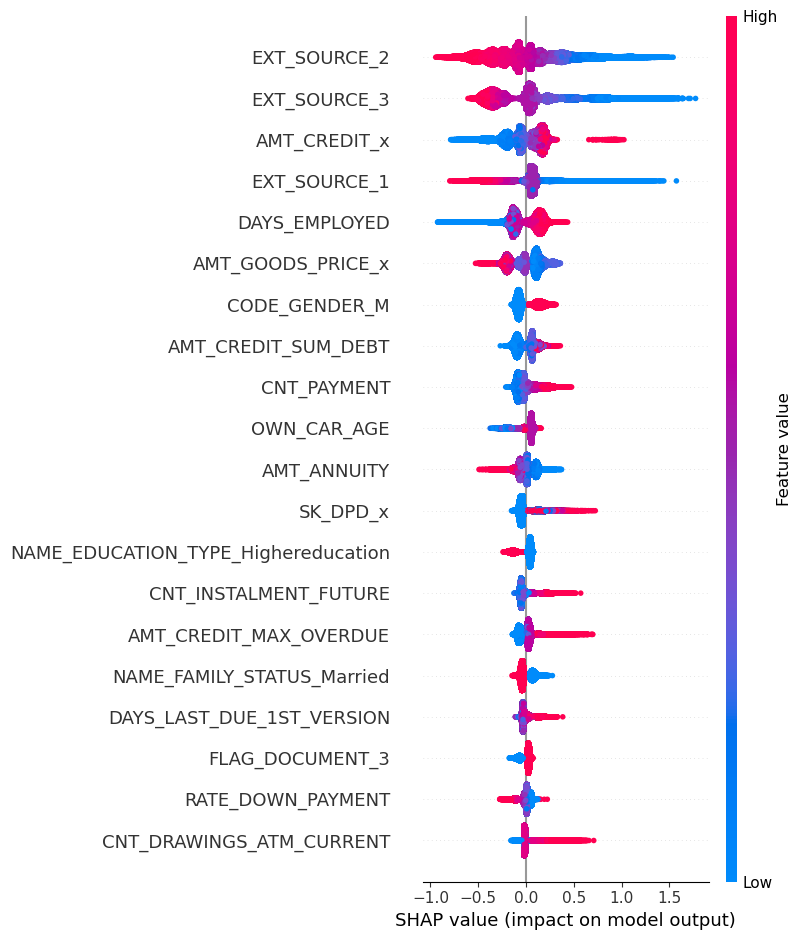

In [36]:
shap.summary_plot(shap_values, X_train_important)